# initialization

## import modules and data locations

In [74]:
# modules
import numpy as np
from numpy import sin, cos
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits import mplot3d
import glob
import gadget_reader.readgadget as readgadget
from itertools import chain
%matplotlib inline

# disky retrograde 30
snaps_dr30 = []
paths_dr30 = ['/net/gaia/data/users/hypatia/villalobos/thick_disk/runs/others/run114-t.highres/runs-diskysat/ret/i30/snaps/snapshot*',
             '/net/virgo01/data/users/roybos/Roy_Gadget/Gadget-2.0.7/disky-ret-i30-fullrun-b/snapshot*',
             '/net/virgo01/data/users/roybos/Roy_Gadget/Gadget-2.0.7/disky-ret-i30-fullrun-2/snapshot*']
for path in paths_dr30:
    snaps_dr30.extend(np.sort(glob.glob(path)))
    
# disky prograde 30
snaps_dp30 = []
paths_dp30 = ['/net/gaia/data/users/hypatia/villalobos/thick_disk/runs/others/run114-t.highres/runs-diskysat/pro/i30/snaps/snapshot*',
             '/net/virgo01/data/users/roybos/Roy_Gadget/Gadget-2.0.7/disky-pro-i30-1/snapshot*']
for path in paths_dp30:
    snaps_dp30.extend(np.sort(glob.glob(path)))
    
# spherical retrograde 30
snaps_sr30 = []
paths_sr30 = ['/net/gaia/data/users/hypatia/villalobos/thick_disk/runs/others/run114-t.highres/runs-sphersat/ret/i30/snaps/snapshot*',
             '/net/virgo01/data/users/roybos/Roy_Gadget/Gadget-2.0.7/spher-ret-i30-fullrun/snapshot*']
for path in paths_sr30:
    snaps_sr30.extend(np.sort(glob.glob(path)))
    
# disky retrograde 60
snaps_dr60 = []
paths_dr60 = ['/net/gaia/data/users/hypatia/villalobos/thick_disk/runs/others/run114-t.highres/runs-diskysat/ret/i60/snaps/snapshot*',
             '/net/virgo01/data/users/roybos/Roy_Gadget/Gadget-2.0.7/disky-ret-i60-1/snapshot_*']
for path in paths_dr60:
    snaps_dr60.extend(np.sort(glob.glob(path)))

## load specific simulation

In [ ]:
# set snaps equal to snaps_dr30, snaps_sr30, snaps_dp30 or snaps_dr60 depending on the simulation
snaps = snaps_dr30

# same for eccentricity
e_star = np.load('/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr30.npy')
e_disk = np.load('/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_dr30.npy')

## define functions

In [ ]:
# unit conversion
m_dm, m_disk, m_bulge, m_star = 5.74e+11, 1.20e+10, 1.13e+11, 2.40e+09      # masses in Msun
unit_l = 3.5                # length in kpc
unit_v = 262.319            # velocity in km/s

Rd = 2.26
Rs = 2.4 * Rd
R_disk = 2.5


# radial distance to the origin, or to r0 if given
def r(pos, r0=False):
    if r0 != False:
        pos -= np.asarray(r0)[np.newaxis].T
    x, y, z = pos
    return np.sqrt(x**2 + y**2 + z**2)


# return time of snapshot i
def time(i):
    return 10 / 2005 * i


# angular momentum as function of position, velocity and mass
def angm(pos, v, m):
    x, y, z = pos
    vx, vy, vz = v
    Lx = m * (z * vy - y * vz)
    Ly = m * (x * vz - z * vx)
    Lz = m * (y * vx - x * vy)
    return Lx, Ly, Lz


# load a specific snapshot from the list of snapshots (snaps)
'''By default, PIDs are not loaded, these are only necessary to track particle selections in multiple snapshots.
Velocities are loaded by default since they are needed to align the snapshot.
The scale multiplies the positions and velocities.
Also gives snap_n, which indicates the current snapshot'''
def loadsnap(i, snaps=snaps, pid=False, v=True, scale=1):
    global pos_dm, pos_disk, pos_star, pos_bulge, snap_n
    snap_n = i

    pos_dm = scale * unit_l * readgadget.readsnap(snaps[i], 'pos', 'dm', suppress=1)
    pos_disk = scale * unit_l * readgadget.readsnap(snaps[i], 'pos', 'disk', suppress=1)
    pos_star = scale * unit_l * readgadget.readsnap(snaps[i], 'pos', 'star', suppress=1)
    pos_bulge = scale * unit_l * readgadget.readsnap(snaps[i], 'pos', 'bulge', suppress=1)
    
    if v == True:
        global v_dm, v_disk, v_star, v_bulge
        v_dm = scale * unit_v * readgadget.readsnap(snaps[i], 'vel', 'dm', suppress=1)
        v_disk = scale * unit_v * readgadget.readsnap(snaps[i], 'vel', 'disk', suppress=1)
        v_star = scale * unit_v * readgadget.readsnap(snaps[i], 'vel', 'star', suppress=1)
        v_bulge = scale * unit_v * readgadget.readsnap(snaps[i], 'vel', 'bulge', suppress=1)
    
    if pid == True:
        global pid_star, pid_disk
        pid_star = readgadget.readsnap(snaps[i], 'pid', 'star', suppress=1)
        pid_disk = readgadget.readsnap(snaps[i], 'pid', 'disk', suppress=1)
    
    
# align L with z-direction, returns a rotation matrix which can be applied to the positions
def alz(L):
    Lx, Ly, Lz = L
    
    # rotation around z
    t1 = np.arctan(Ly / Lx)
    Rz = np.array([[cos(t1), -sin(t1), 0], [sin(t1), cos(t1), 0], [0, 0, 1]])

    # rotation around y
    t2 = np.pi/2 - np.arctan(Lz / np.sqrt(Lx**2 + Ly**2))
    Ry = np.array([[cos(t2), 0, sin(t2)], [0, 1, 0], [-sin(t2), 0, cos(t2)]])

    # rotation matrix
    return np.dot(Rz, Ry)
    
    
# align positions and velocity with angular momentum
'''If rotmat==True, it returns the rotation matrix that was used. 
This rotation matrix can be used as input for Rsnap when loading a different snapshot, so that it has the same alignment.
If sat==True, the system is aligned to the angular momentum of the satellite.
r0 should be an array of 3 values and can be used to artificially shift the position of the center.'''
def align(Rsnap=0, rotmat=False, sat=False, r0=False):
    global pos_dm, pos_disk, pos_star, pos_bulge, v_dm, v_disk, v_star, v_bulge, pos_com
    
    # total center of mass
    if sat == False:
        pos_com = np.mean(pos_disk, axis=0)   
    else:
        pos_com = np.mean(pos_star, axis=0)
        if r0 != False:
            pos_com += r0
    
    # recenter all positions to COM
    for pos in [pos_dm, pos_disk, pos_star, pos_bulge]:
        pos -= pos_com

    # set total momentum to zero by shifting the velocities by the mean velocity
    if sat == False:
        v0 = np.mean(v_disk, axis=0)
    else:
        v0 = np.mean(v_star, axis=0)
    for v in [v_dm, v_disk, v_star, v_bulge]:
        v -= v0 
        
    # find total angular momentum
    if sat == False:
        L_tot = np.sum(angm(pos_disk.T, v_disk.T, m_disk), axis=1)
        '''You can also only consider only the particles within a certain radius from the center:'''
        #L_tot = np.sum([angm(pos_disk.T, v_disk.T, m_disk)[i][r(pos_disk.T) < 25] for i in [0,1,2]], axis=1)
    else:
        L_tot = np.sum(angm(pos_star.T, v_star.T, m_star), axis=1)
    
    # find the rotation matrix necessary to align with L
    if type(Rsnap) == int:      # if rotation matrix is not given, calculate it
        R = alz(L_tot)
    else:                       # if rotation matrix is given, use that matrix
        R = Rsnap

    # do rotation
    pos_dm, pos_disk, pos_star, pos_bulge, v_dm, v_disk, v_star, v_bulge = \
            [np.tensordot(R, x, axes=([0],[1])) for x in \
             [pos_dm, pos_disk, pos_star, pos_bulge, v_dm, v_disk, v_star, v_bulge]]
    
    # return rotation matrix, which can be used as input to align other snaps with this snap
    if rotmat == True:
        return R
    
    
# subroutine to change velocity into cyllindrical coordinates
def v_cyl_sr(pos, vel):
    v_c = np.zeros(np.shape(vel.T))                 # make list to return
    
    # calculate rotation matrix necessary to align position with x-axis
    '''To see why, look at the last part of the simulation section in the thesis'''
    for i in range(np.shape(vel)[1]):
        x, y, z = pos[:, i]
        
        # find angle of the position with respect to x-axis (between 0 and 2 pi)
        t = np.arctan(y / x)
        if (x < 0) & (y > 0):
            t += np.pi
        elif (x > 0) & (y < 0):
            t += 2 * np.pi
        
        # apply rotation matrix to v
        R = np.array([[np.cos(t), -np.sin(t), 0], [np.sin(t), np.cos(t), 0], [0, 0, 1]])
        v_c[i] = np.tensordot(R, vel[:, i], axes=([0], [0]))
    return v_c.T


# to change velocity into cylindrical coordinates without having to input the positions and velocities
def v_cyl():
    global v_disk, v_star
    v_disk = v_cyl_sr(pos_disk, v_disk)
    v_star = v_cyl_sr(pos_star, v_star)


# sorts positions by pid, if v==True also the velocities
def pid_sort(v=False):
    global pid_star, pos_star, pos_disk
    pos_star = np.array(pos_star)[:, np.argsort(pid_star)]
    pos_disk = np.array(pos_disk)[:, np.argsort(pid_disk)]
    
    if v == True:
        global v_star, v_disk
        v_star = np.array(v_star)[:, np.argsort(pid_star)]
        v_disk = np.array(v_disk)[:, np.argsort(pid_disk)]
        
        
# function to select particles by position or angular momentum to be between l and h
def s_vz(l, h, L=False):
    if L == False:
        v = np.abs(v_star[2])
    elif L == True:
        v = L_star[2]
    return (v > l) & (v < h)


# function to select particles in a cylindrical shell with 1 < R/Rd < 3, between zmin < z < zmax
def s_z(pos, zmax, zmin=0, z0=1.65):
    r_xy = np.sqrt(pos[0]**2 + pos[1]**2)
    s_R = (r_xy > 2*Rd) & (r_xy < 3*Rd)
    s_z = (np.abs(pos[2]/z0) < zmax) & (np.abs(pos[2]/z0) > zmin)
    return s_R * s_z 


# change location of sphere of selection
def sphloc(loc, Rs=Rs):
    global Rs_list

    # if z not in loc, add a zero
    if len(loc) == 2:
        loc.append(0)

    # find location of sphere
    Rs_list = np.reshape(Rs * np.asarray(loc), (3,1))
    
    
'''Failed methods of finding the COM more precisely
# iteratively find the COM of particles that are within spheres of decreasing size
def it(pos, a=500, b=50, n=60):
    z = np.linspace(a, b, n)
    com = np.mean(pos, axis=0)
    for i in z:
        # boolean to select particles within a sphere of radius i from the COM
        k = r((pos - com).T) < i
        
        # find mean position of particles within the sphere
        com = np.mean(pos[k], axis=0)
    return com


# iteratively find COM of particles that stay within a sphere
def it2(pos, com, s_bound_old=True, R=20):
    # boolean to select particles within a sphere of radius R from the COM
    s_sphere = r((pos - com).T) < R
    
    # only use particles that were bound before
    s_bound = s_bound_old * s_sphere
    
    # find center of mass
    com_new = np.mean(pos.T * s_bound, axis=1)
    return com_new, s_bound
'''

# logarithmic transparent density colormap for plotting positions
def cma(r=0, g=0, b=0):
    k = np.logspace(-1.9, 0, 100)
    k[0] = 0
    alphas = np.array([np.linspace(0, 1, 100), k, k]).T
    cdict = {'red': ((0., 1., 1.), (1., r, r)),
             'green': ((0., 1., 1.), (1., g, g)),
             'blue': ((0., 1., 1.), (1., b, b)),
             'alpha': alphas
            }
    return LinearSegmentedColormap('Dropout', cdict)

## define particle selections

In [ ]:
# rotation matrix of first snapshot
loadsnap(0)
R_0 = align(rotmat=True)

# rotation matrix of last snapshot
loadsnap(-1)
R_last = align(rotmat=True)

# shell particles
if snaps_dr30 == snaps:
    loadsnap(288, pid=True)
    align()
    pid_sort(v=True)
    L_star = angm(pos_star, v_star, 1)

    # boolean to select entire shell
    s_pos_shell = ((r(pos_star) > 32) & (r(pos_star) < 40))     # boolean to select particles in shell
    
    # boolean to select part of a shell
    s_pos_shell_piece = s_pos_shell * ((pos_star[0] < -10) & (pos_star[1] < 0))
    s_pos_shell_piece2 = ((r(pos_star) > 15) & (r(pos_star) < 20)) \
            & ((pos_star[0] < 15) & (pos_star[1] < -13) & (pos_star[2] > -5))
    
    # boolean to select thin shell
    s_shell = (r(pos_star) > 34) & (r(pos_star) < 37) #&\
            #(L_star[2] < 0) & (pos_star[1] < -pos_star[0])


elif snaps_dp30 == snaps:
    loadsnap(400, pid=True)
    align()
    pid_sort()
    s_pos_shell = ((r(pos_star) > 26) & (r(pos_star) < 32))     # boolean to select particles in shell
    

# particles in tail of velocity distribution
loadsnap(-1, pid=True)
align()
pid_sort(v=True)
s_v1_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)
s_v_tail = ((v_star[1] > 150) & (np.sqrt(v_star[0]**2 + v_star[2]**2) < 150))
s_tail = s_v1_star * s_v_tail

# particles selected by eccentricity
loadsnap(1500, pid=True)
align()
pid_sort(v=True)
s_ecc_low = e_star < .5
s_ecc_high = e_star > .8

# position

## one snapshot

In [ ]:
loadsnap(400, pid=True)
align(R_0, sat=False)
pid_sort(v=True)

s_pos_shell_piece2 = ((r(pos_star) > 15) & (r(pos_star) < 20)) & ((pos_star[0] < 15) & (pos_star[1] < -13) & (pos_star[2] > -5))

fig, ax = plt.subplots(1, 2, figsize=(9,4))
ax[0].scatter(pos_disk[0], pos_disk[1], s=0.001, label='host')
#ax[0].scatter(pos_star[0], pos_star[1], s=0.002, label='star')
#ax[0].scatter(pos_star[0, s_shell], pos_star[1, s_shell], s=0.2, label='shell')
#ax[0].scatter(pos_star[0][s_pos_shell_piece], pos_star[1][s_pos_shell_piece], s=.1, label='shell')
#ax[0].scatter(pos_star[0][s_pos_shell_piece2], pos_star[1][s_pos_shell_piece2], s=.1, label='shell')
#ax[0].scatter(pos_star[0][s_tail], pos_star[1][s_tail], s=10, label='tail')
#ax[0].scatter(pos_star[0][s_Lz_ecc_4], pos_star[1][s_Lz_ecc_4], s=1, label='arm')

ax[0].set_ylabel('y')
ax[1].scatter(pos_disk[0], pos_disk[2], s=0.001, label='host')
#ax[1].scatter(pos_star[0], pos_star[2], s=0.002, label='star')
#ax[1].scatter(pos_star[0][s_pos_shell_piece], pos_star[2][s_pos_shell_piece], s=.1, label='shell')
#ax[1].scatter(pos_star[0][s_pos_shell_piece2], pos_star[2][s_pos_shell_piece2], s=.1, label='shell')
#ax[1].scatter(pos_star[0][s_Lz_ecc_4], pos_star[2][s_Lz_ecc_4], s=1, label='arm')
#ax[1].scatter(pos_star[0][s_tail], pos_star[2][s_tail], s=10, label='tail')
#ax[1].scatter(pos_star[0][s_shell], pos_star[2][s_shell], s=0.2, label='shell')

ax[1].set_ylabel('z')
for i in [0,1]:
    ax[i].set_xlim(-20, 20)
    ax[i].set_ylim(-20, 20)
    ax[i].set_xlabel('x')
    ax[i].set_aspect('equal')
    lgnd = ax[i].legend(loc=1)
    for component in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[component]._sizes = [30]
fig.suptitle('Spatial distributions at ${:.2f} \ Gyr$'.format(time(snap_n)), fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()

## first 4 Gyr

/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


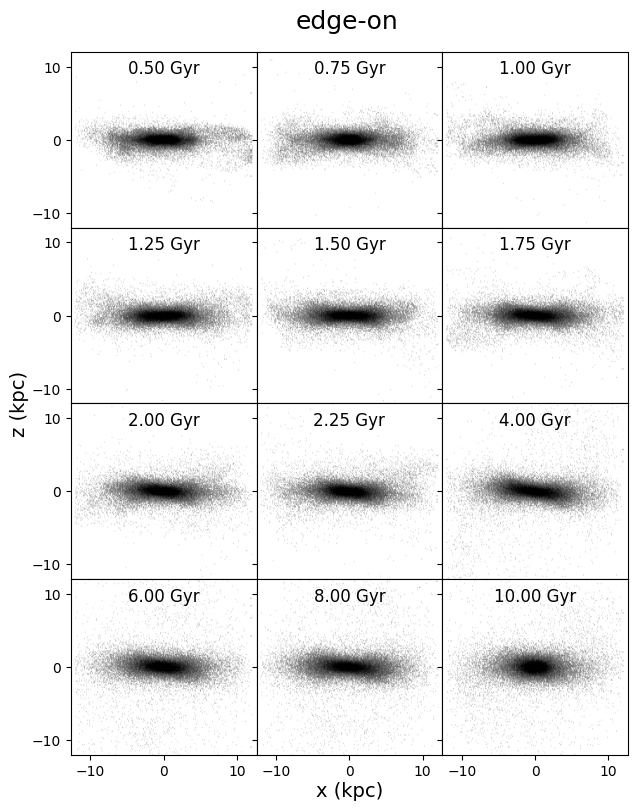

In [191]:
# find rotation matrix of first snapshot
loadsnap(2004)
R_0 = align(rotmat=True)

# initialize figure
fig, ax = plt.subplots(4, 3, figsize=(6,8), dpi=100, sharex=True, sharey=True)
ax = ax.ravel()

# second axis, 1 for y and 2 for z
k = 2

snaplist = [100, 150, 200, 250, 300, 350, 401, 451, 801, 1202, 1603, 2004]
for i, j in enumerate(snaplist):
    # load data
    loadsnap(j)
    align()
    
    limits = [-12, 12, -12, 12]
    ax[i].set_xlim(limits[0], limits[1])
    ax[i].set_ylim(limits[2], limits[3])
    ax[i].set_aspect('equal')
    
    # plot subplots
    ax[i].hexbin(pos_disk[0], pos_disk[k], bins=np.logspace(-0.7, 1.7, 100), gridsize=250, \
                 cmap='Greys', extent=limits)
    ax[i].text(0, 9, '{:.2f} Gyr'.format(time(j)), fontsize=12, ha='center')
    
ax[10].annotate('x (kpc)', (0.5, -0.5), xytext=(0, 30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='center', va='bottom', size=14)
if k == 1:
    ax[3].annotate('y (kpc)', (0, 0), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
    plt.suptitle('face-on', fontsize=18)
if k == 2:
    ax[3].annotate('z (kpc)', (0, 0), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
    plt.suptitle('edge-on', fontsize=18)
    
fig.tight_layout(rect=[-0.05, 0, 1, 0.95])
plt.subplots_adjust(wspace=0, hspace=0)
plt.xticks(np.arange(-10, 11, step=10))
plt.yticks(np.arange(-10, 11, step=10))
plt.show()

## shell selection

/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


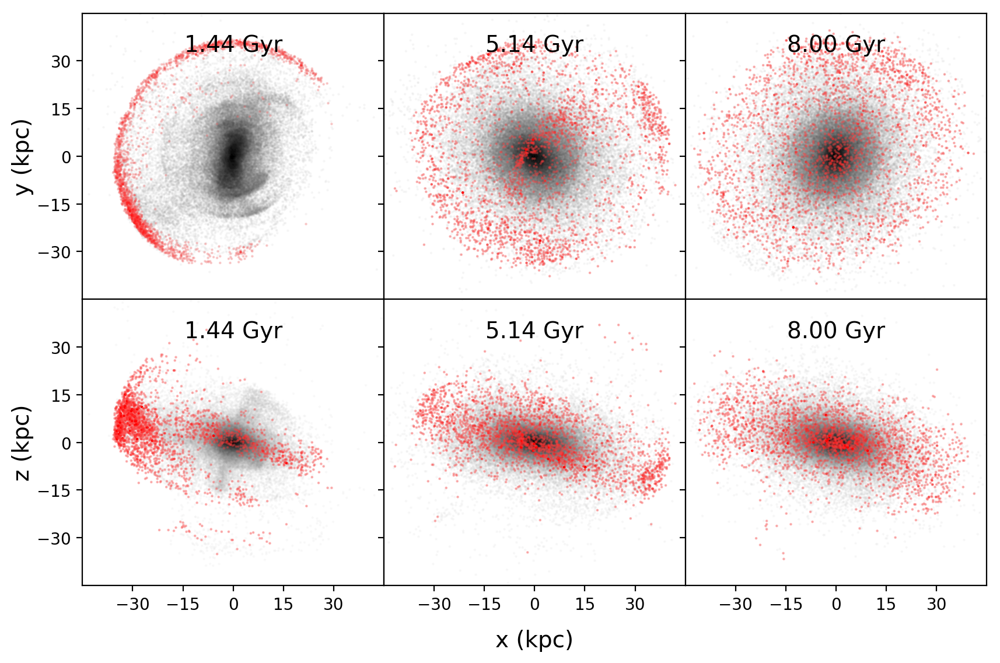

In [69]:
# find rotation matrix of first snapshot
loadsnap(0)
R_0 = align(rotmat=True)

# initialize figure
fig, ax = plt.subplots(2, 3, figsize=(10,6.5), dpi=200, sharex=True, sharey=True)
ax = ax.ravel()
l = [-45, 45, -45, 45]

snaplist = [288, 1030, 1603, 288, 1030, 1603]
for i, j in enumerate(snaplist):
    # load data
    loadsnap(j, pid=True)
    align()
    pid_sort()

    ax[i].set_xlim(l[0], l[1])
    ax[i].set_ylim(l[2], l[3])
    if i <=2:
        k = 1
    if i > 2:
        k = 2
    ax[i].hexbin(pos_star[0], pos_star[k], bins=np.logspace(-1.2, 15, 100), gridsize=300, \
                     cmap=cma(r=0, g=0, b=0), extent=l)
    ax[i].hexbin(pos_star[0][s_shell], pos_star[k][s_shell], bins=np.logspace(-1.5, 1, 10), \
                     cmap=cma(r=1, g=0, b=0), extent=l, gridsize=300)

    ax[i].text(0, 33, '{:.2f} Gyr'.format(time(j)), fontsize=14, ha='center')
    
ax[4].annotate('x (kpc)', (0.5, -0.4), xytext=(0, 30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='center', va='bottom', size=14)
ax[0].annotate('y (kpc)', (0, 0.5), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
ax[3].annotate('z (kpc)', (0, 0.5), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
#plt.suptitle('edge-on', fontsize=18)
#fig.tight_layout(rect=[-0.05, 0, 1, 0.93])
plt.subplots_adjust(wspace=0, hspace=0)
plt.xticks(np.arange(-30, 31, step=15))
plt.yticks(np.arange(-30, 31, step=15))
plt.show()

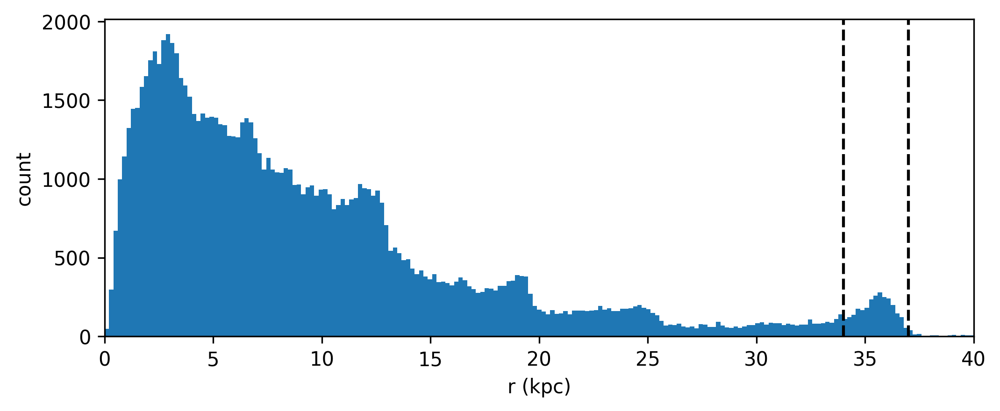

In [72]:
loadsnap(288)
align()

plt.figure(figsize=(8, 3), dpi=300)
plt.hist(r(pos_star), bins=np.linspace(0, 40, 200))
plt.axvline(37, c='k', linestyle='--')
plt.axvline(34, c='k', linestyle='--')

plt.xlim(0, 40)
plt.xlabel('r (kpc)')
plt.ylabel('count')
plt.show()

## one particle

### find positions of one particle over time

### plot positions of one particle over time

# velocity

## load snapshot and make selections

In [14]:
loadsnap(2004, pid=True, scale=1)
align()
pid_sort(v=True)
v_cyl()

# location of sphere of selection
Rs = 2.4 * Rd
R_disk = 2.5
R_disk *= 1

# boolean to select paticles within a sphere of radius 2.5 kpc at x = Rs
s_v1_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
s_v1_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)

# boolean to select paticles within a sphere of radius 2 kpc at x = Rs
s_v2_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
s_v2_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)

## velocity diagrams

In [5]:
v_star *= 1.5
v_disk *= 1.5

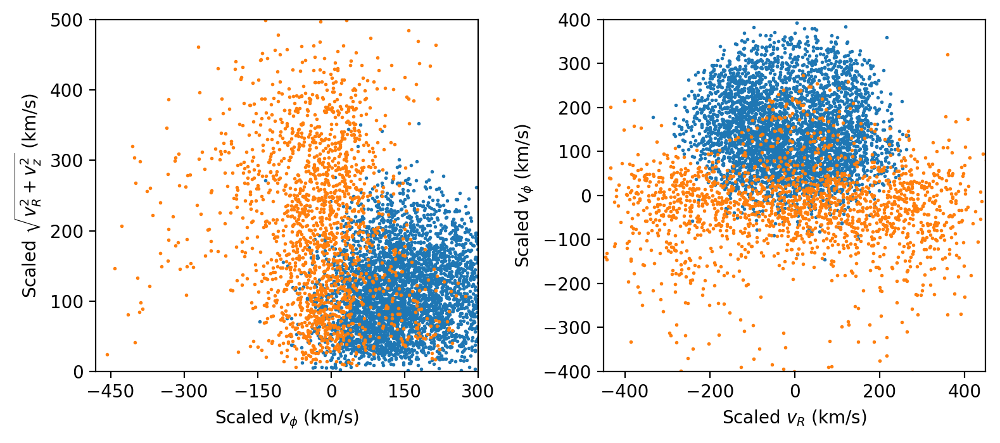

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(8,4), dpi=200)
ax[0].scatter(-v_disk[1][s_v1_disk], np.sqrt(v_disk[0]**2 + v_disk[2]**2)[s_v1_disk], s=1,  label='host')
ax[0].scatter(-v_star[1][s_v1_star], np.sqrt(v_star[0]**2 + v_star[2]**2)[s_v1_star], s=1,  label='satellite')
ax[0].set_xlabel(r'Scaled $v_\phi$ (km/s)')
ax[0].set_ylabel(r'Scaled $\sqrt{v_R^2 + v_z^2}$ (km/s)')
ax[0].set_xlim(-480, 300)
ax[0].set_ylim(0, 500)
ax[0].set_xticks(np.linspace(-450, 300, 6))

ax[1].scatter(v_disk[0][s_v2_disk], -v_disk[1][s_v2_disk], s=1, label='host')
ax[1].scatter(v_star[0][s_v2_star], -v_star[1][s_v2_star], s=1, label='satellite')
ax[1].set_xlabel(r'Scaled $v_R$ (km/s)')
ax[1].set_ylabel(r'Scaled $v_\phi$ (km/s)')
ax[1].set_xlim(-450, 450)
ax[1].set_ylim(-400, 400)

'''for i in [0,1]:
    lgnd = ax[i].legend(loc=1)
    for component in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[component]._sizes = [30]'''
#fig.suptitle('Velocity distributions at ${:.2f} \ Gyr$'.format(time(snap_n)), fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()

### at different distances

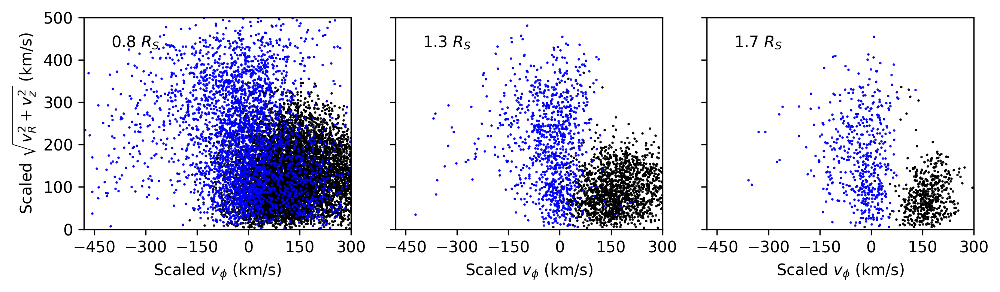

In [16]:
loadsnap(1880, pid=True, scale=1)
align()
pid_sort(v=True)
v_cyl()
v_star *= 1.5
v_disk *= 1.5

fig, ax = plt.subplots(1, 3, figsize=(9,3), dpi=300, sharey=True)

# location of sphere of selection
for i, k in enumerate([0.8, 1.3, 1.7]):
    Rs = 2.4 * Rd * k
    R_disk = 2.5
    R_disk *= 1

    # boolean to select paticles within a sphere of radius 2.5 kpc at x = Rs
    s_v1_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
    s_v1_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)

    # boolean to select paticles within a sphere of radius 2 kpc at x = Rs
    s_v2_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
    s_v2_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)

    ax[i].scatter(-v_disk[1][s_v1_disk], np.sqrt(v_disk[0]**2 + v_disk[2]**2)[s_v1_disk], s=.3,  label='host', c='k')
    ax[i].scatter(-v_star[1][s_v1_star], np.sqrt(v_star[0]**2 + v_star[2]**2)[s_v1_star], s=.3,  label='satellite', c='b')
    ax[i].set_xlabel(r'Scaled $v_\phi$ (km/s)')
    ax[i].set_xlim(-480, 300)
    ax[i].set_ylim(0, 500)
    ax[i].set_xticks(np.linspace(-450, 300, 6))
    ax[i].annotate('{} $R_S$'.format(k), (-400, 430))
    
#fig.suptitle('Velocity distributions at ${:.2f} \ Gyr$'.format(time(snap_n)), fontsize=20)
ax[0].set_ylabel(r'Scaled $\sqrt{v_R^2 + v_z^2}$ (km/s)')
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()

# angular momentum

## load snapshot and make selections

In [17]:
loadsnap(2004, pid=True)
align()
pid_sort(v=True)

# angular momenta of disk and star particles, normalized to mass
L_disk = angm(pos_disk, v_disk, 1)
L_star = angm(pos_star, v_star, 1)

# boolean to select particles within 2 < r < 12 kpc and |z| < 1 kpc
s_L_disk = ((r(pos_disk) > 2) & (r(pos_disk) < 12) & (pos_disk[2] > -1) & (pos_disk[2] < 1))
s_L_star = ((r(pos_star) > 2) & (r(pos_star) < 12) & (pos_star[2] > -1) & (pos_star[2] < 1))

# boolean to select retrograde particles from satellite galaxy
s_L_ret = (L_star[2][s_L_star] < -500)  # with spatial selection
s_L_ret2 = (L_star[2] < -1000)          # without spatial selection

## histogram

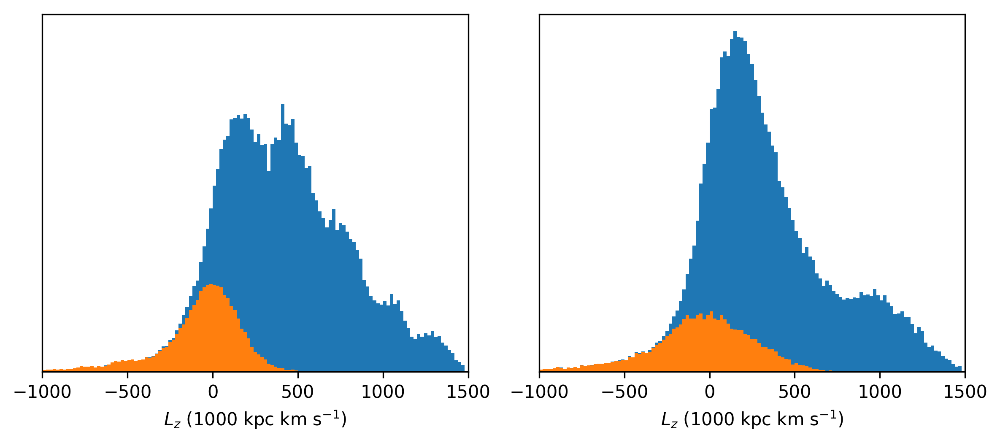

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(8,4), dpi=300, sharey=True)

loadsnap(401, pid=True)
align()
pid_sort(v=True)

# angular momenta of disk and star particles, normalized to mass
L_disk = angm(pos_disk, v_disk, 1)
L_star = angm(pos_star, v_star, 1)

# boolean to select particles within 2 < r < 12 kpc and |z| < 1 kpc
s_L_disk = ((r(pos_disk) > 2) & (r(pos_disk) < 12) & (pos_disk[2] > -1) & (pos_disk[2] < 1))
s_L_star = ((r(pos_star) > 2) & (r(pos_star) < 12) & (pos_star[2] > -1) & (pos_star[2] < 1))

hist, bins_ = np.histogram(L_star[2][s_L_star], bins=range(-1500, 1500, 20))
freq1 = hist/np.sum(hist)*m_star
ax[0].bar(bins_[:-1], freq1, align="edge", width=np.diff(bins_), color=u'#ff7f0e')

hist, bins_ = np.histogram(L_disk[2][s_L_disk], bins=range(-1500, 1500, 20))
freq2 = hist/np.sum(hist)*m_disk
ax[0].bar(bins_[:-1], freq2, bottom=freq1, align="edge", width=np.diff(bins_), color=u'#1f77b4')

loadsnap(2004, pid=True)
align()
pid_sort(v=True)

# angular momenta of disk and star particles, normalized to mass
L_disk = angm(pos_disk, v_disk, 1)
L_star = angm(pos_star, v_star, 1)

# boolean to select particles within 2 < r < 12 kpc and |z| < 1 kpc
s_L_disk = ((r(pos_disk) > 2) & (r(pos_disk) < 12) & (pos_disk[2] > -1) & (pos_disk[2] < 1))
s_L_star = ((r(pos_star) > 2) & (r(pos_star) < 12) & (pos_star[2] > -1) & (pos_star[2] < 1))

hist, bins_ = np.histogram(L_star[2][s_L_star], bins=range(-1500, 1500, 20))
freq1 = hist/np.sum(hist)*m_star
ax[1].bar(bins_[:-1], freq1, align="edge", width=np.diff(bins_), color=u'#ff7f0e')

hist, bins_ = np.histogram(L_disk[2][s_L_disk], bins=range(-1500, 1500, 20))
freq2 = hist/np.sum(hist)*m_disk
ax[1].bar(bins_[:-1], freq2, bottom=freq1, align="edge", width=np.diff(bins_), color=u'#1f77b4')

for i in [0,1]:
    ax[i].set_xlim(-1000, 1500)
    ax[i].set_xlabel(r'$L_z$ (1000 kpc km s$^{-1}$)')
    ax[i].get_yaxis().set_visible(False)
    '''for i in [0,1]:
    lgnd = ax[i].legend(loc=1)
    for component in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[component]._sizes = [30]'''
#fig.suptitle('Velocity distributions at ${:.2f} \ Gyr$'.format(time(snap_n)), fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()

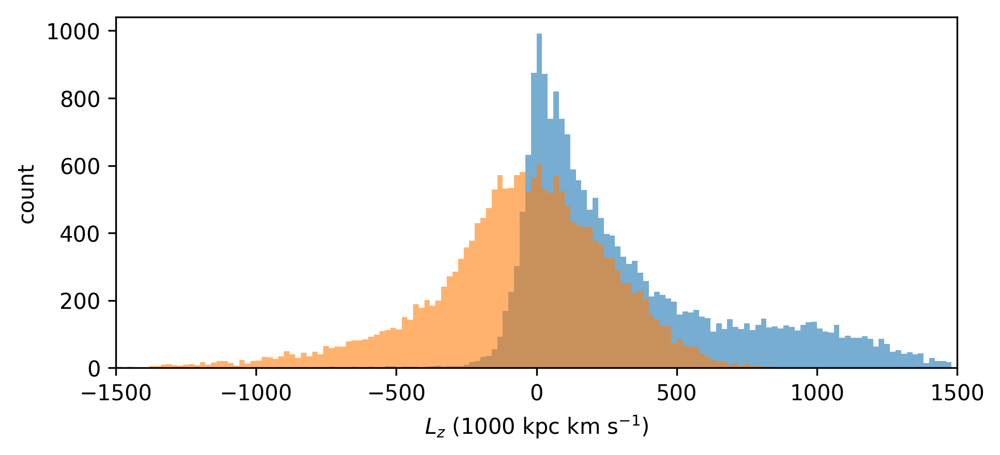

In [19]:
plt.figure(figsize=(7,3), dpi=300)
plt.hist(L_disk[2][s_L_star], \
         bins=range(-1500, 1500, 20), alpha=.6, label='host')
plt.hist(L_star[2][s_L_star], \
         bins=range(-1500, 1500, 20), alpha=.6, label='satellite')
plt.xlim(-1500, 1500)
plt.xlabel(r'$L_z$ (1000 kpc km s$^{-1}$)')
plt.ylabel('count')
#plt.title('Angular momentum distribution')
#plt.legend()
plt.show()

## radial distribution

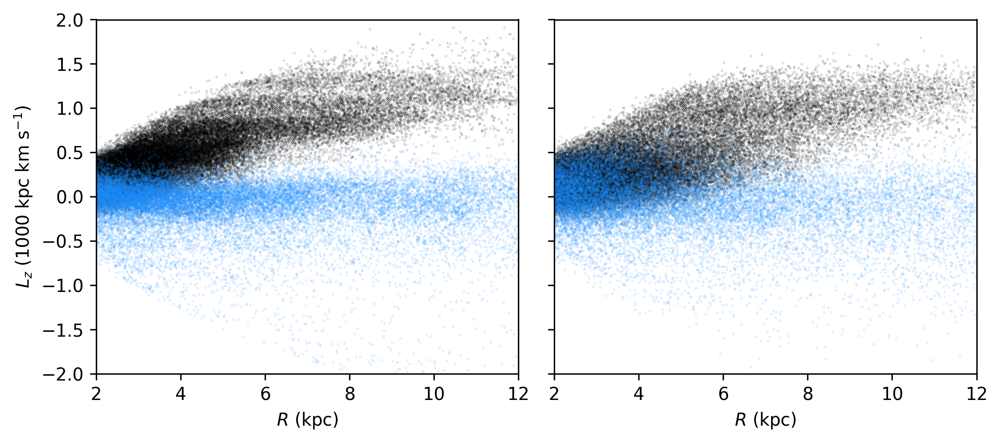

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(8,4), dpi=300, sharey=True)

loadsnap(401, pid=True)
align()
pid_sort(v=True)

# angular momenta of disk and star particles, normalized to mass
L_disk = angm(pos_disk, v_disk, 1)
L_star = angm(pos_star, v_star, 1)

# boolean to select particles within 2 < r < 12 kpc and |z| < 1 kpc
s_L_disk = ((r(pos_disk) > 2) & (r(pos_disk) < 12) & (pos_disk[2] > -1) & (pos_disk[2] < 1))
s_L_star = ((r(pos_star) > 2) & (r(pos_star) < 12) & (pos_star[2] > -1) & (pos_star[2] < 1))

ax[0].scatter(r(pos_disk)[s_L_disk], L_disk[2][s_L_disk] / 1000, s=0.005, label='host', c='k')
ax[0].scatter(r(pos_star)[s_L_star], L_star[2][s_L_star] / 1000, s=0.005, label='satellite', c='dodgerblue')

loadsnap(2004, pid=True)
align()
pid_sort(v=True)

# angular momenta of disk and star particles, normalized to mass
L_disk = angm(pos_disk, v_disk, 1)
L_star = angm(pos_star, v_star, 1)

# boolean to select particles within 2 < r < 12 kpc and |z| < 1 kpc
s_L_disk = ((r(pos_disk) > 2) & (r(pos_disk) < 12) & (pos_disk[2] > -1) & (pos_disk[2] < 1))
s_L_star = ((r(pos_star) > 2) & (r(pos_star) < 12) & (pos_star[2] > -1) & (pos_star[2] < 1))

ax[1].scatter(r(pos_disk)[s_L_disk], L_disk[2][s_L_disk] / 1000, s=0.005, label='host', c='k')
ax[1].scatter(r(pos_star)[s_L_star], L_star[2][s_L_star] / 1000, s=0.005, label='satellite', c='dodgerblue')

for i in [0,1]:
    ax[i].set_xlim(2, 12)
    ax[i].set_ylim(-2, 2)
    ax[i].set_xlabel(r'$R$ (kpc)')
ax[0].set_ylabel(r'$L_z$ (1000 kpc km s$^{-1}$)')

'''for i in [0,1]:
    lgnd = ax[i].legend(loc=1)
    for component in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[component]._sizes = [30]'''
#fig.suptitle('Velocity distributions at ${:.2f} \ Gyr$'.format(time(snap_n)), fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()

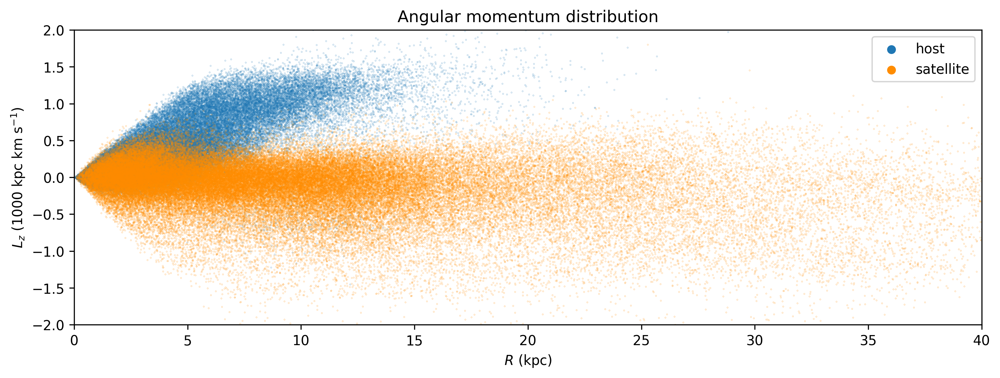

In [22]:
plt.figure(figsize=(12, 4), dpi=300)
plt.scatter(r(pos_disk), L_disk[2] / 1000, s=.01, label='host')
plt.scatter(r(pos_star), L_star[2] / 1000, s=.01, c='darkorange', label='satellite')
#plt.scatter(r(pos_star)[s_L_ret2], L_star[2][s_L_ret2] / 1000, s=.1, c='green', label='retrograde selection')
#plt.scatter(r(pos_star)[s_tail], L_star[2][s_tail] / 1000, s=10, c='black', label='tail')
#plt.scatter(r(pos_star)[s_shell], L_star[2][s_shell] / 1000, s=.03, c='k', label='shell')
#plt.scatter(r(pos_star)[s_ecc_low], L_star[2][s_ecc_low] / 1000, s=.01, c='r', label='low eccentricity')

plt.xlim(0, 40)
plt.ylim(-2, 2)
plt.xlabel(r'$R$ (kpc)')
plt.ylabel(r'$L_z$ (1000 kpc km s$^{-1}$)')
plt.title('Angular momentum distribution')

# to show actually visible dots in the legend
lgnd = plt.legend(loc=1)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [30]

# eccentricity

## find eccentricity

In [ ]:
r_pos_disk, localmin, localmax = [], [], []

snapshot_range = np.arange(1500, 2000, 1)
for i in snapshot_range:
    # load snap, align and sort by PID
    loadsnap(i, pid=True)
    align()
    pid_sort()
    
    # find orbital radius and append to list
    r_last = r(pos_disk)
    r_pos_disk.append(r_last)
    
    try:
        # find local minima and maxima
        s_localmin = (((r_pos_disk[-2] < r_pos_disk[-1]) & (r_pos_disk[-2] < r_pos_disk[-3])))
        s_localmax = (((r_pos_disk[-2] > r_pos_disk[-1]) & (r_pos_disk[-2] > r_pos_disk[-3])))
        
        # append extrema, set other values to 0
        localmin.append(list(np.where(s_localmin, r_pos_disk[-2], 0)))
        localmax.append(list(np.where(s_localmax, r_pos_disk[-2], 0)))
    except:
        None
        
    # get rid of fourth last values of the orbital radius (which are no longer necessary to find local extrema)
    if len(r_pos_disk) == 4:
        r_pos_disk.pop(0)

# convert to numpy arrays
localmin = np.array(localmin)
localmax = np.array(localmax)

# set values that are not local extrema to nan
localmin[localmin == 0] = np.nan
localmax[localmax == 0] = np.nan

# take means of local extrema of each particle
peri = np.nanmean(localmin, axis=0)
apo = np.nanmean(localmax, axis=0)

# determine ellipticity
e_disk = (apo - peri) / (apo + peri)
e_star[np.isnan(e_star)] = -1          # set nan values to -1

# save data to file
np.save('/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_dr60.npy', e_disk)

## load snapshot and make selections

In [25]:
loadsnap(1970, pid=True)
align()
pid_sort(v=True)

# angular momenta of disk and star particles, normalized to mass
L_disk = angm(pos_disk, v_disk, 1)
L_star = angm(pos_star, v_star, 1)

# boolean to select prograde particles (Lz > 0)
s_pro_star = L_star[2] > 0
s_pro_disk = L_disk[2] > 0

## histogram

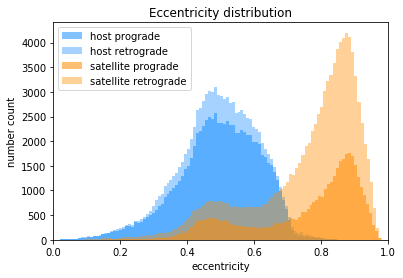

In [27]:
# plotting
bins = 100
plt.hist(e_disk[s_pro_disk], bins=bins, alpha=0.55, color='dodgerblue', label='host prograde')
plt.hist(e_disk, bins=bins, alpha=0.4, color='dodgerblue', label='host retrograde')
plt.hist(e_star[s_pro_star], bins=bins, alpha=0.55, color='darkorange', label='satellite prograde')
plt.hist(e_star, bins=bins, alpha=0.4, color='darkorange', label='satellite retrograde')
plt.xlim(0, 1)
plt.xlabel('eccentricity')
plt.ylabel('number count')
plt.title('Eccentricity distribution')
plt.legend()
plt.show()

## stacked bar plot

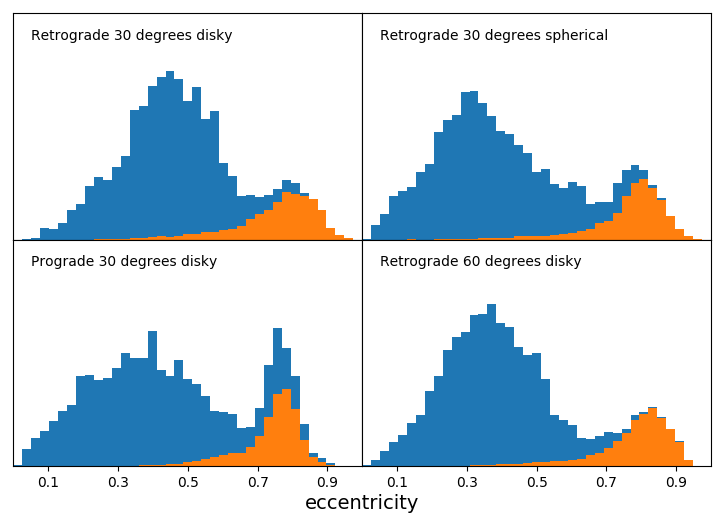

In [10]:
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import Grid

bins = np.linspace(0, 1, 40)

fig = plt.figure(figsize=(9, 6), dpi=100)
a = fig.add_subplot(111)
a.set_xlabel('eccentricity', fontsize=14, labelpad=20)
#a.set_ylabel('counts', fontsize=14, labelpad=40)

a.spines['right'].set_visible(False)
a.spines['left'].set_visible(False)
a.spines['top'].set_visible(False)
a.spines['bottom'].set_visible(False)
a.get_xaxis().set_ticks([])
a.get_yaxis().set_ticks([])

grid = Grid(fig, rect=111, nrows_ncols=(2,2),
            axes_pad=0, label_mode='L'
            )

# list data
ecc_list = ['/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr30.npy',
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_sr30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dp30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr60.npy']
ecc_list2 = ['/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_dr30.npy',
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_sr30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_dp30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_dr60.npy']
snaps_list = [snaps_dr30, snaps_sr30, snaps_dp30, snaps_dr60]
title_list = ['Retrograde 30 degrees disky', 'Retrograde 30 degrees spherical', \
              'Prograde 30 degrees disky', 'Retrograde 60 degrees disky'] 

Rd = 2.26
Rs = 2.4 * Rd

# function which gives a boolean to select particles in a cylindrical shell with 1 < R/Rd < 3
def s_z(pos, zmax, zmin=0, z0=1.65):
    r_xy = np.sqrt(pos[0]**2 + pos[1]**2)
    s_R = (r_xy > 2*Rd) & (r_xy < 3*Rd)
    s_z = (np.abs(pos[2]/z0) < zmax) & (np.abs(pos[2]/z0) > zmin)
    return s_R * s_z 

for i, ax in enumerate(grid):
    loadsnap(2004, snaps=snaps_list[i], pid=True)
    align()
    pid_sort()
    
    s_v1_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
    s_v1_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)
    
    e_star_i = np.load(ecc_list[i]) 
    e_disk_i = np.load(ecc_list2[i]) 
    
    hist, bins_ = np.histogram(e_star_i[s_z(pos_star, 3, 1)], bins=bins)
    freq1 = hist/np.sum(hist)*m_star
    ax.bar(bins_[:-1], freq1, align="edge", width=np.diff(bins_), color=u'#ff7f0e')

    hist, bins_ = np.histogram(e_disk_i[s_z(pos_disk, 3, 1)], bins=bins)
    freq2 = hist/np.sum(hist)*m_disk
    ax.bar(bins_[:-1], freq2, bottom=freq1, align="edge", width=np.diff(bins_), color=u'#1f77b4')
    ax.get_yaxis().set_visible(False)
    #ax.hist(e_disk_i[s_pro_disk], bins=bins, alpha=0.55, color='dodgerblue', label='host prograde')
    #ax.hist(e_disk_i, bins=bins, alpha=0.7, color='dodgerblue', label='host retrograde')
    #ax.hist(e_star_i[s_pro_star], bins=bins, alpha=0.55, color='darkorange', label='satellite prograde')
    #ax.hist(e_star_i, bins=bins, alpha=0.7, color='darkorange', label='satellite retrograde')
    ax.locator_params(nbins=6)
    ax.set_xlim(0, 1)
    ax.set_xticks([0.1, 0.3, 0.5, 0.7, 0.9])
    ax.set_ylim(0, 1.3e9)
    ax.annotate(title_list[i], xy=(0.05, 1.15e9))
plt.show()

## within shell selection

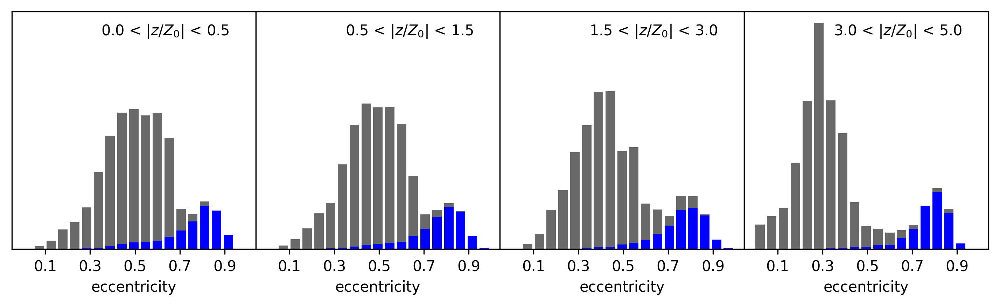

In [35]:
loadsnap(2004, snaps=snaps_dr30, pid=True)
e_star = np.load('/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr30.npy')
e_disk = np.load('/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_dr30.npy')
align()
pid_sort()

fig, ax = plt.subplots(1, 4, figsize=(12,3), sharey=True, dpi=300)
bins = np.linspace(0, 1, 20)

for a, j in zip(ax, [[0.5, 0], [1.5, 0.5], [3, 1.5], [5, 3]]):
    a.get_yaxis().set_visible(False)

    hist, bins_ = np.histogram(e_star[s_z(pos_star, j[0], j[1])], bins=bins)
    freq1 = hist/np.sum(hist)*m_star
    a.bar(bins_[:-1], freq1, align="edge", width=.8*np.diff(bins_), color='b')#color=u'#ff7f0e')

    hist, bins_ = np.histogram(e_disk[s_z(pos_disk, j[0], j[1])], bins=bins)
    freq2 = hist/np.sum(hist)*m_disk
    a.bar(bins_[:-1], freq2, bottom=freq1, align="edge", width=.8*np.diff(bins_), color='dimgrey')#color=u'#1f77b4')

    a.set_xlabel('eccentricity')
    a.set_xticks([0.1, 0.3, 0.5, 0.7, 0.9])
    
    if j == [5, 3]:
        ymax = a.get_ylim()[1]    
    
for a, j in zip(ax, [[0.5, 0], [1.5, 0.5], [3, 1.5], [5, 3]]):
    a.annotate('{:.1f} < |$z / Z_0|$ < {:.1f}'.format(j[1], j[0]), xy=(0.35, 0.9*ymax))
    
plt.subplots_adjust(wspace=0)
plt.show()

## within radial selection

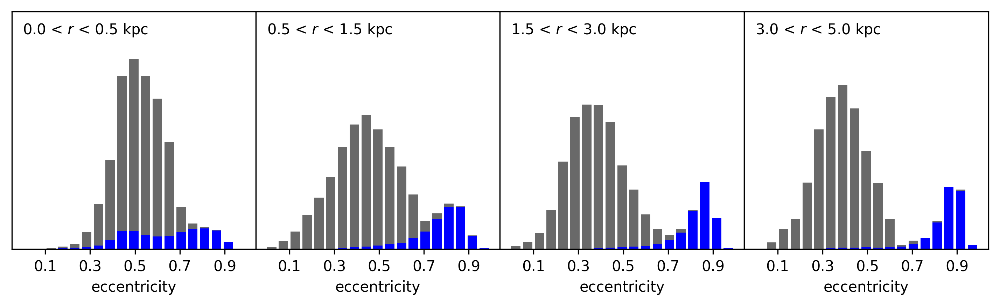

In [73]:
def s_r(pos, high, low):
    return (r(pos) < high) & (r(pos) > low)


fig, ax = plt.subplots(1, 4, figsize=(12,3), sharey=True, dpi=300)
bins = np.linspace(0, 1, 20)

loadsnap(2004, snaps=snaps_dr30, pid=True)
align()
pid_sort()
    
e_star = np.load('/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr30.npy')
e_disk = np.load('/Users/users/roybos/Documents/Bachelor_Project/data/ecc_disk_dr30.npy')

for a, j in zip(ax, [[5, 0], [10, 5], [15, 10], [20, 15]]):
    a.get_yaxis().set_visible(False)

    hist, bins_ = np.histogram(e_star[s_r(pos_star, j[0], j[1])], bins=bins)
    freq1 = hist/np.sum(hist)*m_star
    a.bar(bins_[:-1], freq1, align="edge", width=.8*np.diff(bins_), color='b')#color=u'#ff7f0e')

    hist, bins_ = np.histogram(e_disk[s_r(pos_disk, j[0], j[1])], bins=bins)
    freq2 = hist/np.sum(hist)*m_disk
    a.bar(bins_[:-1], freq2, bottom=freq1, align="edge", width=.8*np.diff(bins_), color='dimgrey')#color=u'#1f77b4')

    a.set_xlabel('eccentricity')
    a.set_xticks([0.1, 0.3, 0.5, 0.7, 0.9])
    
    if j == [5, 3]:
        ymax = a.get_ylim()[1]    
    #a.hist(e_disk[s_z(pos_disk, j[0], j[1], 0.095)], bins=bins, alpha=0.6, color='dodgerblue', label='host', normed=True)
    #a.hist(e_star[s_z(pos_star, j[0], j[1], 0.165)], bins=bins, alpha=0.6, color='maroon', label='satellite', normed=True)
    
for a, j in zip(ax, [[0.5, 0], [1.5, 0.5], [3, 1.5], [5, 3]]):
    a.set_ylim(0, 1.05*ymax)
    a.annotate('{:.1f} < $r$ < {:.1f} kpc'.format(j[1], j[0]), xy=(0, 0.95*ymax))
    
plt.subplots_adjust(wspace=0)
plt.show()

# eccentricity-v

## at different solar positions

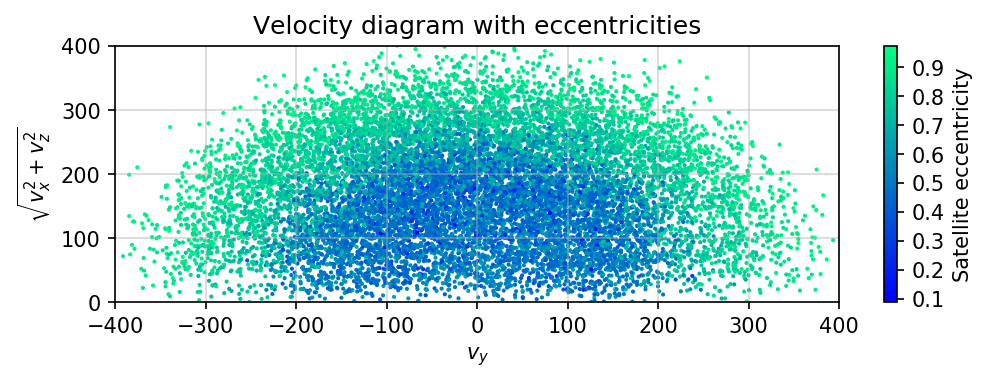

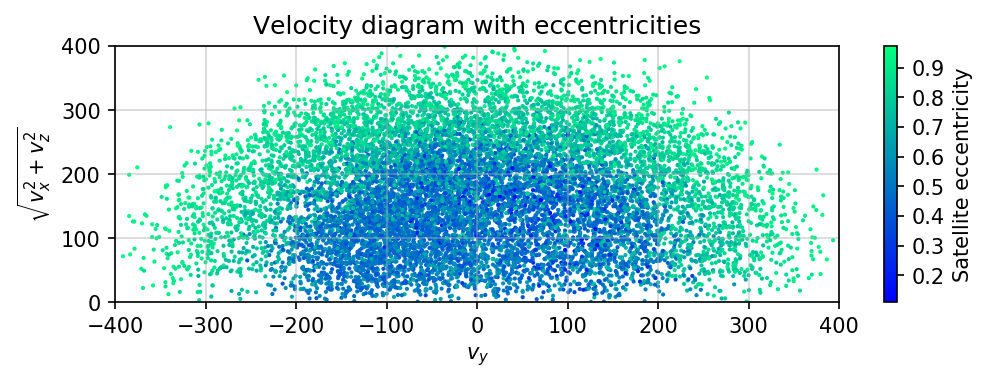

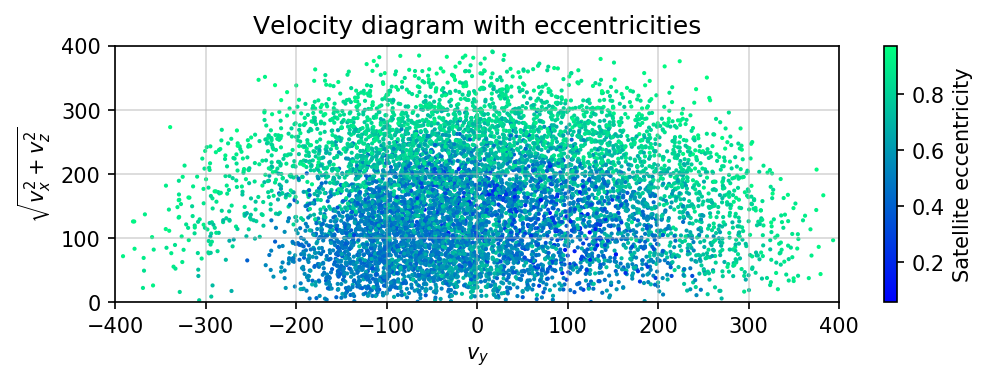

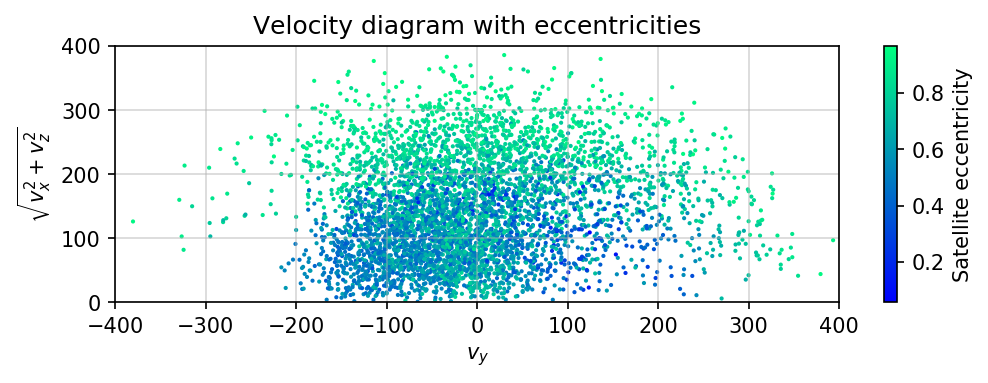

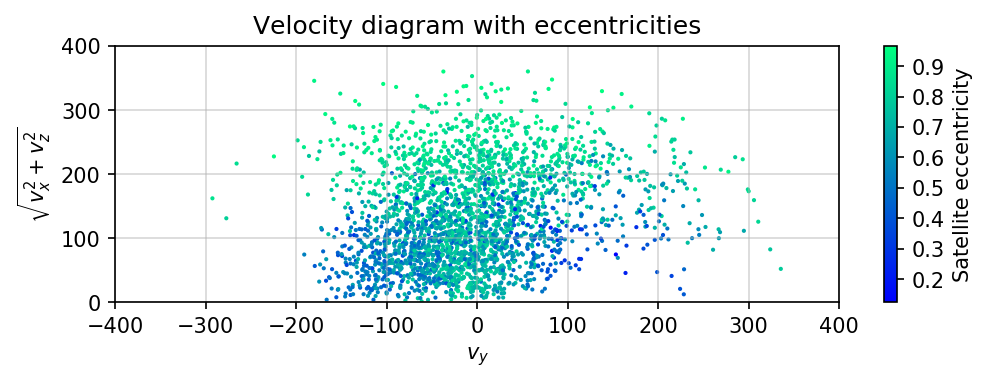

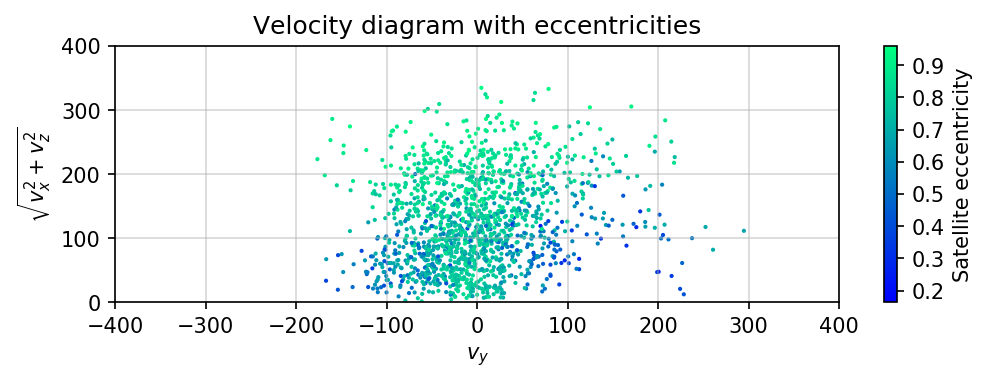

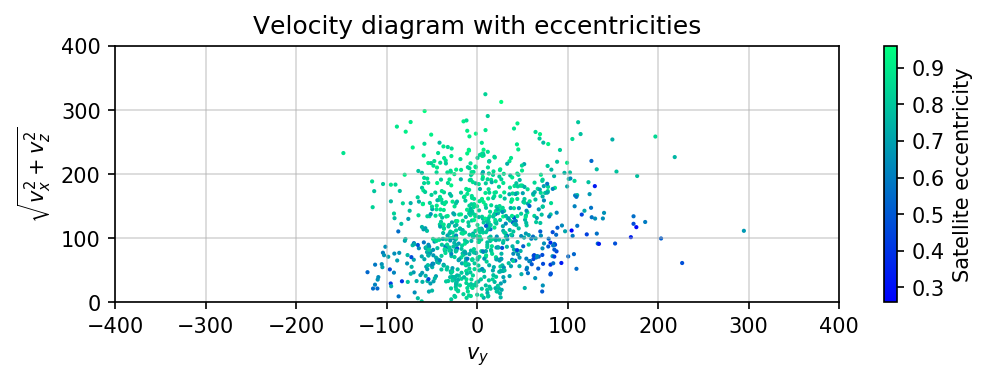

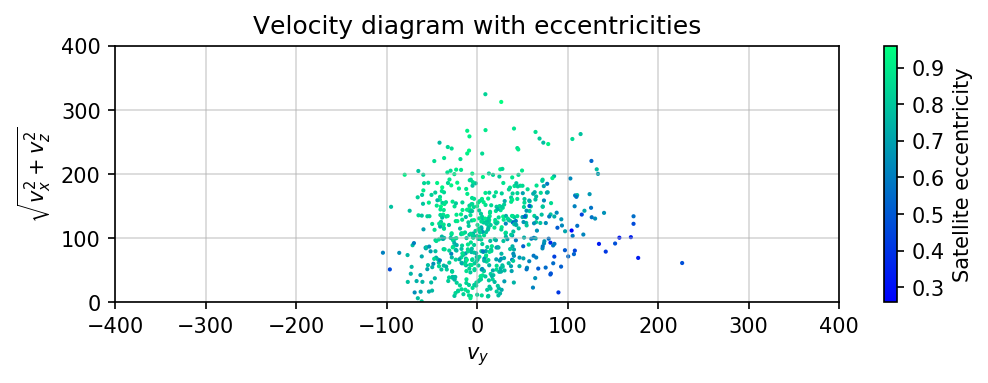

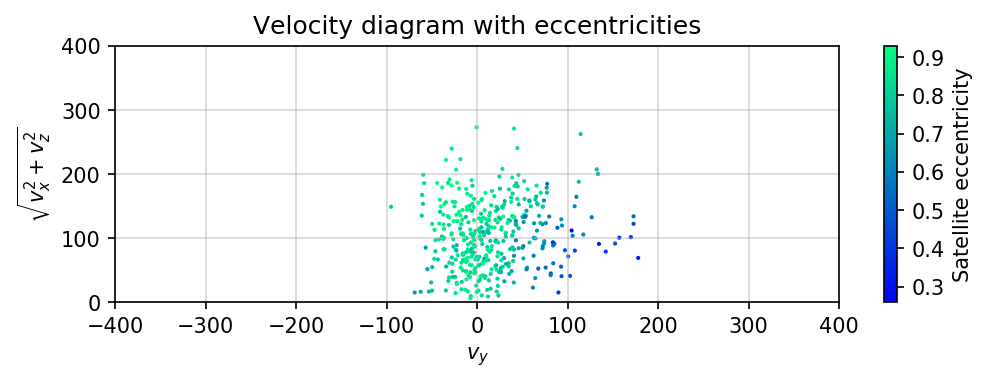

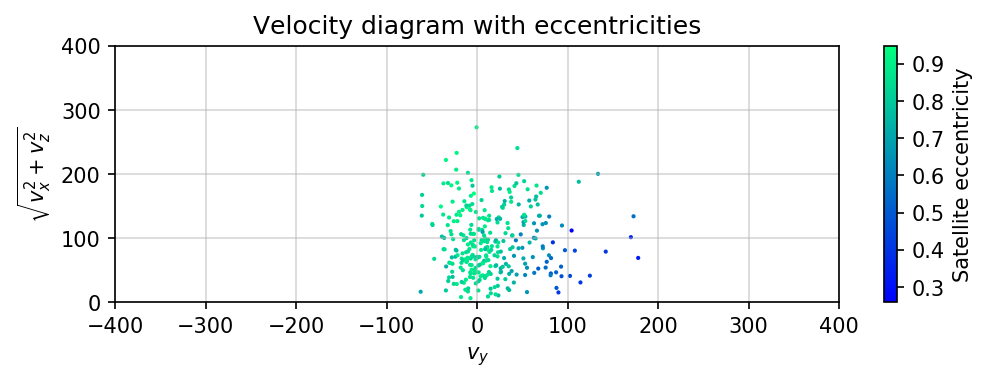

In [36]:
loadsnap(-1, pid=True)
align()
pid_sort(v=True)

for i in np.linspace(0, 2, 10):
    Rs = 2.4 * Rd
    Rs *= i
    R_disk = 2.5
    R_disk *= 1

    # boolean to select paticles within a sphere of radius 2.5 kpc at x = Rs
    s_v1_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
    s_v1_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)

    # boolean to select particles in tail
    s_tail = s_v1_star * ((v_star[1] > 150) & (np.sqrt(v_star[0]**2 + v_star[2]**2) < 150))

    plt.figure(figsize=(7, 2.5), dpi=150)
    #scat1 = plt.scatter(v_disk[1][s_v1_disk], np.sqrt(v_disk[0][s_v1_disk]**2 + v_disk[2][s_v1_disk]**2), c=e_disk[s_v1_disk], cmap='spring', s=5)
    scat2 = plt.scatter(v_star[1][s_v1_star], np.sqrt(v_star[0][s_v1_star]**2 + v_star[2][s_v1_star]**2), c=e_star[s_v1_star], cmap='winter', s=1)
    #plt.colorbar(scat1, label='Host eccentricity')
    plt.colorbar(scat2, label='Satellite eccentricity')

    #plt.plot(x, f(x), linestyle='--', c='k')
    plt.xlabel(r'$v_y$')
    plt.ylabel(r'$\sqrt{v_x^2 + v_z^2}$')
    plt.xlim(-400, 400)
    plt.ylim(0, 400)
    plt.tight_layout()
    plt.grid(alpha=0.5)
    plt.title('Velocity diagram with eccentricities')
    plt.show()
Rs = 2.4 * Rd

## at solar position

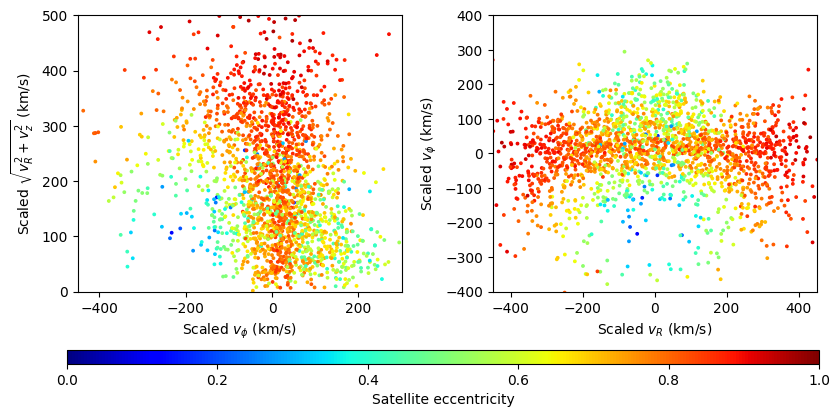

In [38]:
R_disk = 2.5
R_disk *= 1

loadsnap(2004, pid=True)
align()
pid_sort(v=True)
sphloc([1,0])
v_cyl()

v_star *= 1.5
v_disk *= 1.5

# boolean to select paticles within a sphere of radius 2.5 kpc at x = Rs
s_v1_star = r(pos_star - Rs_list) < R_disk

# plotting
fig, ax = plt.subplots(1, 2, figsize=(8,4.5), dpi=100)

ax[0].scatter(-v_star[1][s_v1_star], np.sqrt(v_star[0]**2 + v_star[2]**2)[s_v1_star], s=3, c=e_star[s_v1_star], cmap='jet', vmin=0, vmax=1, label='satellite')
ax[0].set_xlabel(r'Scaled $v_\phi$ (km/s)')
ax[0].set_ylabel(r'Scaled $\sqrt{v_R^2 + v_z^2}$ (km/s)')
ax[0].set_xlim(-450, 300)
ax[0].set_ylim(0, 500)

scat = ax[1].scatter(v_star[0][s_v1_star], -v_star[1][s_v1_star], s=3, c=e_star[s_v1_star], cmap='jet', vmin=0, vmax=1, label='satellite')
ax[1].set_xlabel(r'Scaled $v_R$ (km/s)')
ax[1].set_ylabel(r'Scaled $v_\phi$ (km/s)')
ax[1].set_xlim(-450, 450)
ax[1].set_ylim(-400, 400)

fig.tight_layout(rect=[-0.05, 0, 1, .94])
fig.subplots_adjust(bottom=0.28)
cbar_ax = fig.add_axes([0.04, 0.12, 0.94, 0.03])
fig.colorbar(scat, cax=cbar_ax, label='Satellite eccentricity', orientation='horizontal')

plt.show()

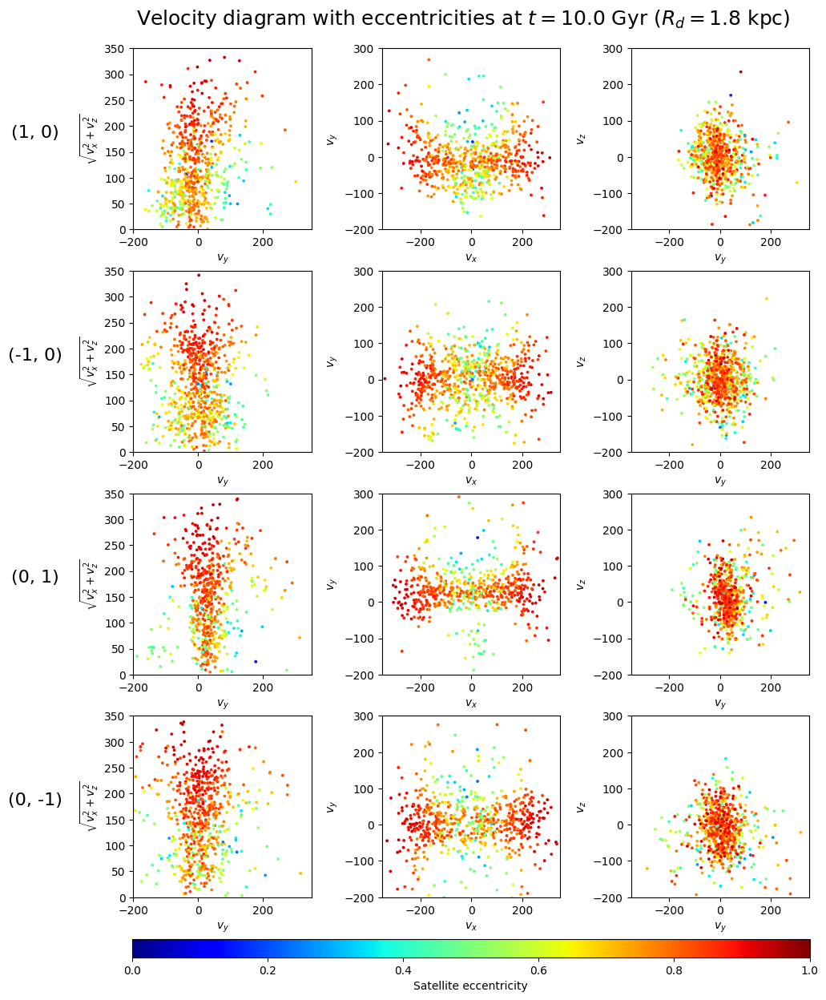

In [40]:
R_disk = 2.5
R_disk *= .7

# plotting
fig, ax = plt.subplots(4, 3, figsize=(9,15), dpi=100)
for i, loc_list in enumerate([[1, 0], [-1, 0], [0, 1], [0, -1]]):
    loadsnap(2004, pid=True)
    align()
    pid_sort(v=True)
    v_cyl()
    
    # change position of solar neighbourhood
    sphloc(loc_list)

    # boolean to select paticles within a sphere of radius 2.5 kpc at x = Rs
    s_v1_star = r(pos_star - Rs_list) < R_disk

    # boolean to select particles in tail
    s_tail = s_v1_star * ((v_star[1] > 150) & (np.sqrt(v_star[0]**2 + v_star[2]**2) < 150))


    ax[i,0].scatter(v_star[1][s_v1_star], np.sqrt(v_star[0]**2 + v_star[2]**2)[s_v1_star], s=3, c=e_star[s_v1_star], cmap='jet', vmin=0, vmax=1, label='satellite')
    ax[i,0].set_xlabel(r'$v_y$')
    ax[i,0].set_ylabel(r'$\sqrt{v_x^2 + v_z^2}$')
    ax[i,0].set_xlim(-200, 350)
    ax[i,0].set_ylim(0, 350)
    ax[i,0].annotate('({}, {})'.format(loc_list[0], loc_list[1]), (-0.55, 0.35), xytext=(0, 30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='center', va='center', size=16)
    
    scat = ax[i,1].scatter(v_star[0][s_v1_star], v_star[1][s_v1_star], s=3, c=e_star[s_v1_star], cmap='jet', vmin=0, vmax=1, label='satellite')
    ax[i,1].set_xlabel(r'$v_x$')
    ax[i,1].set_ylabel(r'$v_y$')
    ax[i,1].set_xlim(-350, 350)
    ax[i,1].set_ylim(-200, 300)
    
    scat = ax[i,2].scatter(v_star[1][s_v1_star], v_star[2][s_v1_star], s=3, c=e_star[s_v1_star], cmap='jet', vmin=0, vmax=1, label='satellite')
    ax[i,2].set_xlabel(r'$v_y$')
    ax[i,2].set_ylabel(r'$v_z$')
    ax[i,2].set_xlim(-350, 350)
    ax[i,2].set_ylim(-200, 300)
    
    sphloc(loc_list)
    
fig.tight_layout(rect=[-0.05, 0, 1, .96])
fig.subplots_adjust(bottom=0.24)
cbar_ax = fig.add_axes([0.04, 0.19, 0.94, 0.015])
fig.colorbar(scat, cax=cbar_ax, label='Satellite eccentricity', orientation='horizontal')
fig.suptitle(r'Velocity diagram with eccentricities at $t = {:.1f}$ Gyr ($R_d = {:.1f}$ kpc)'\
             .format(time(snap_n), R_disk), fontsize=18)
plt.show()

## eccentricity distribution as function of $v_z$

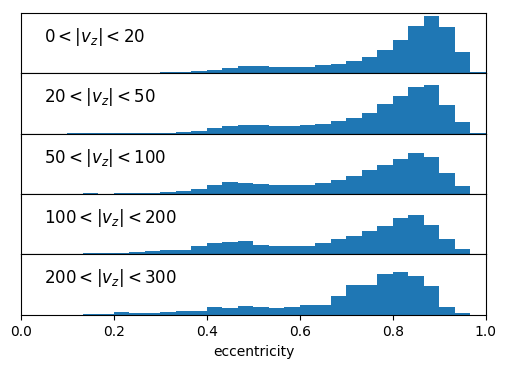

In [41]:
loadsnap(1500, pid=True)
align()
pid_sort(v=True)
L_star = angm(pos_star, v_star, 1)

x = np.array([[0, 20], [20, 50], [50, 100], [100, 200], [200, 300]])
fig, ax = plt.subplots(len(x), 1, figsize=(6, 4), dpi=100, sharex=True, sharey=True)
for i, a in enumerate(ax):
    a.hist(e_star[s_vz(x[i, 0], x[i, 1])], bins=np.linspace(0, 1, 31), normed=True)
    a.annotate(r'${} < |v_z| < {}$'.format(x[i,0], x[i,1]), (0.05,3), size=12)
fig.subplots_adjust(hspace=0)
#fig.suptitle('Eccentricity distribution as function of $v_z$', fontsize=16)
plt.xlabel('eccentricity')
plt.yticks([])
plt.xlim(0, 1)
plt.show()

# eccentricity-Lz

## eccentricity distribution as function of Lz

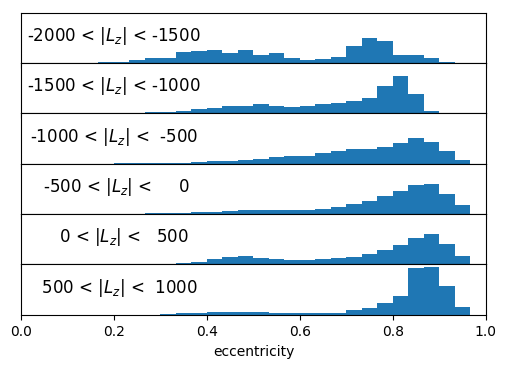

In [43]:
loadsnap(1500, pid=True)
align()
pid_sort(v=True)
L_star = angm(pos_star, v_star, 1)

x = np.array([[-2000, -1500], [-1500, -1000], [-1000, -500], [-500, 0], [0, 500], [500, 1000]])
fig, ax = plt.subplots(len(x), 1, figsize=(6, 4), dpi=100, sharex=True, sharey=True)
for i, a in enumerate(ax):
    a.hist(e_star[s_vz(x[i, 0], x[i, 1], L=True)], bins=np.linspace(0, 1, 31), normed=True)
    a.annotate(r'{:5d} < $|L_z|$ < {:5d}'.format(x[i,0], x[i,1]), (0.2,3.5), size=12, ha='center')
fig.subplots_adjust(hspace=0)
#fig.suptitle('Eccentricity distribution as function of $L_z$', fontsize=16)
plt.xlabel('eccentricity')
plt.yticks([])
plt.xlim(0, 1)
plt.show()

/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':
/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


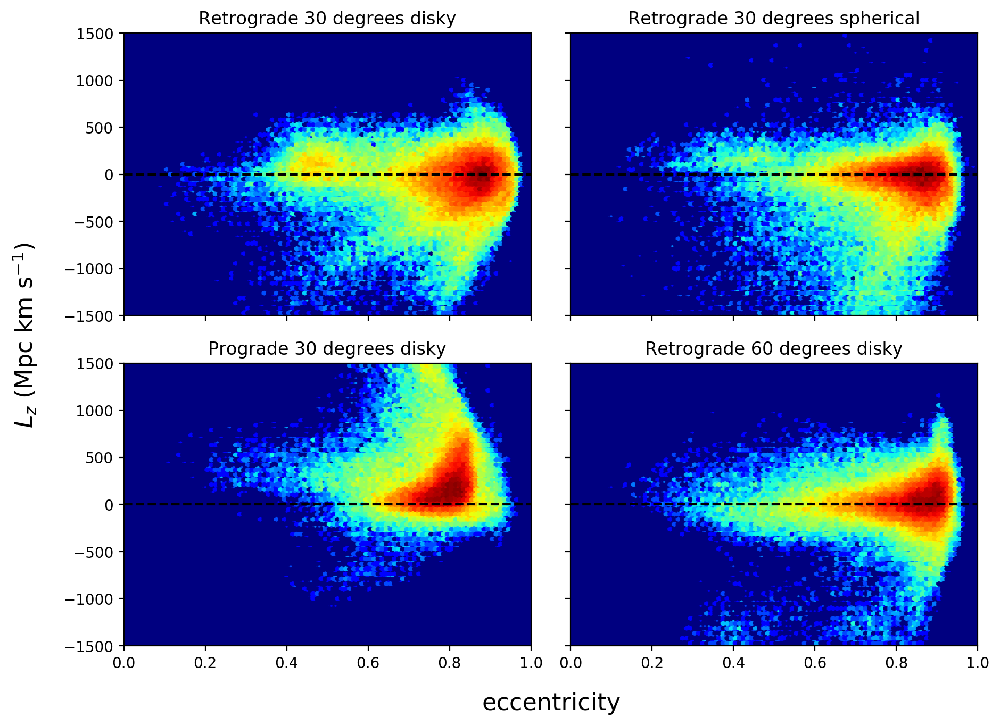

In [44]:
fig, ax = plt.subplots(2, 2, figsize=(9, 7), sharex=True, sharey=True, dpi=200)      # initiate figure
ax = ax.ravel()

# list data
ecc_list = ['/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr30.npy',
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_sr30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dp30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr60.npy']
snaps_list = [snaps_dr30, snaps_sr30, snaps_dp30, snaps_dr60]
title_list = ['Retrograde 30 degrees disky', 'Retrograde 30 degrees spherical', \
              'Prograde 30 degrees disky', 'Retrograde 60 degrees disky'] 
for i in range(4):
    # load data of simulation i
    snaps = snaps_list[i]
    loadsnap(2004, pid=True, snaps=snaps)
    align()
    pid_sort(v=True)
    L_star = angm(pos_star, v_star, 1)
    e_star_i = np.load(ecc_list[i]) 
    
    # set limits
    s_x = e_star_i > 0
    s_y = (L_star[2] > -1550) & (L_star[2] < 1550)
    
    # plotting
    limits = [0, 1, -1500, 1500]
    ax[i].hexbin(e_star_i[s_x*s_y], L_star[2][s_x*s_y], bins=np.logspace(0, 2.5, 100), cmap='jet', extent=limits)
    ax[i].axhline(0, c='k', linestyle='--')
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(limits[0], limits[1])
    ax[i].set_ylim(limits[2], limits[3])

plt.tight_layout(rect=[0, 0, 1, 0.93])
#fig.suptitle('Eccentricity versus angular momentum', fontsize=20)

# axis labels
ax[2].annotate('eccentricity', (1.05, -0.4), xytext=(0, 30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='center', va='bottom', size=16)
ax[2].annotate(r'$L_z$ (Mpc km s$^{-1}$)', (-0.1, 1.1), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=16, rotation=90)

fig.show()

## particle selections

/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


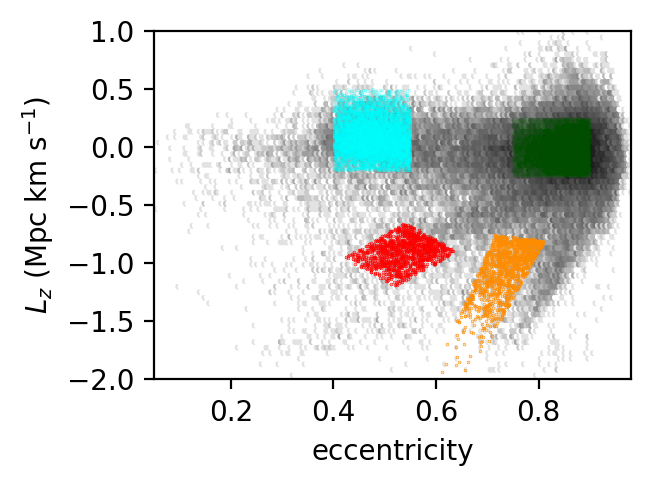

In [54]:
loadsnap(1500, pid=True)
align()
pid_sort(v=True)
L_star = angm(pos_star, v_star, 1)

plt.figure(figsize=(4/1.3, 3/1.3), dpi=200)
plt.hexbin(e_star, L_star[2]/1000, bins=np.logspace(-0.5, 2, 100), gridsize=200, cmap='Greys')
plt.xlim(0.05, .98)
plt.ylim(-2000/1000, 1000/1000)
plt.xlabel('eccentricity')
plt.ylabel(r'$L_z$ (Mpc km s$^{-1}$)')    

# selection
s_Lz_ecc_1 = (L_star[2] > -200) & (L_star[2] < 500) & (e_star > 0.4) & (e_star < 0.55)
def s_bounds(e):
    return 2500 * e - 2500, 2500 * e - 2000, - 2500 * e + 700, - 2500 * e + 100
s_Lz_ecc_2 = (L_star[2] > s_bounds(e_star)[0]) & (L_star[2] < s_bounds(e_star)[1]) & \
            (L_star[2] < s_bounds(e_star)[2]) & (L_star[2] > s_bounds(e_star)[3]) & (e_star > 0.4)
s_Lz_ecc_3 = (L_star[2] > -250) & (L_star[2] < 250) & (e_star > 0.75) & (e_star < 0.9)
def s_bounds_2(e):
    return 8000 * e - 7300, 10000 * e - 7900, - 500 * e -400
s_Lz_ecc_4 = (L_star[2] > s_bounds_2(e_star)[0]) & (L_star[2] < s_bounds_2(e_star)[1]) & \
            (L_star[2] < s_bounds_2(e_star)[2])
def s_bounds_3(e):
    return 1700 * e - 1500, 2500 * e - 1300, - 2500 * e + 400, - 2500 * e - 300
s_Lz_ecc_5 = (L_star[2] > s_bounds_3(e_star)[0]) & (L_star[2] < s_bounds_3(e_star)[1]) & \
            (L_star[2] < s_bounds_3(e_star)[2]) & (L_star[2] > s_bounds_3(e_star)[3]) & (e_star < 0.4)

e = np.linspace(0, 1, 10)
plt.scatter(e_star[s_Lz_ecc_1], L_star[2][s_Lz_ecc_1]/1000, s=0.005, c='cyan', label='left blob')
plt.scatter(e_star[s_Lz_ecc_2], L_star[2][s_Lz_ecc_2]/1000, s=0.05, c='r', label='left arm')
plt.scatter(e_star[s_Lz_ecc_3], L_star[2][s_Lz_ecc_3]/1000, s=0.00005, c='green', label='right blob')
plt.scatter(e_star[s_Lz_ecc_4], L_star[2][s_Lz_ecc_4]/1000, s=0.05, c='darkorange', label='right arm')
#plt.scatter(e_star[s_Lz_ecc_5], L_star[2][s_Lz_ecc_5], s=1, alpha=0.4, c='pink', label='leftest arm')
plt.show()

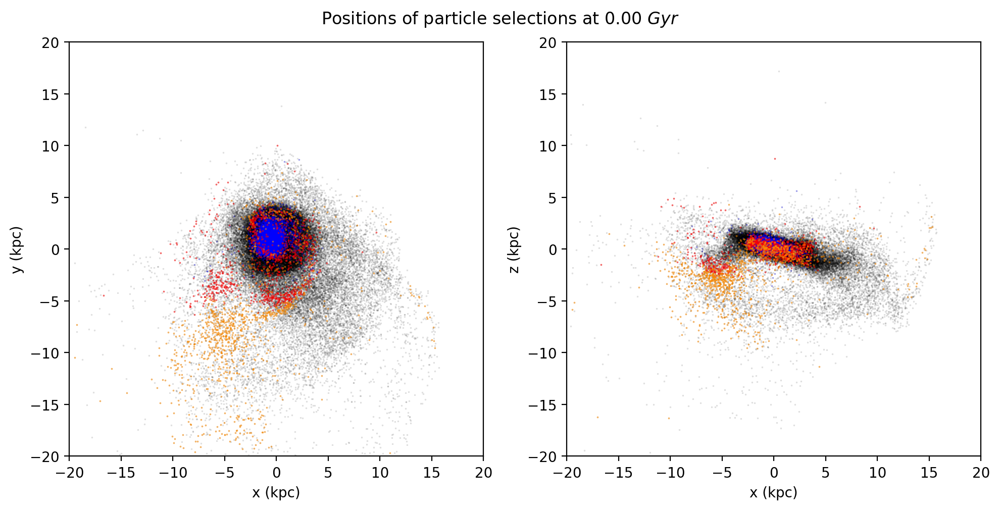

In [59]:
loadsnap(0, pid=True)
align(sat=True)
pid_sort()
fig, ax = plt.subplots(1, 2, figsize=(10,5), dpi=200)

ax[0].scatter(pos_star[0], pos_star[1], s=0.01, marker='.', c='k', label='satellite')
#ax[0].scatter(pos_star[0][s_Lz_ecc_7], pos_star[1][s_Lz_ecc_7], s=1, marker='.', c='magenta', label='satellite')
#ax[0].scatter(pos_star[0][s_Lz_ecc_8], pos_star[1][s_Lz_ecc_8], s=1, marker='.', c='orange', label='satellite')
ax[0].scatter(pos_star[0, s_Lz_ecc_1], pos_star[1, s_Lz_ecc_1], s=0.05, marker='.', c='blue', label='left blob')
ax[0].scatter(pos_star[0, s_Lz_ecc_2], pos_star[1, s_Lz_ecc_2], s=.2, marker='.', c='r', label='left arm')
ax[0].scatter(pos_star[0, s_Lz_ecc_4], pos_star[1, s_Lz_ecc_4], s=.2, marker='.', c='darkorange', label='right arm')
#ax[0].scatter(pos_star[0][s_Lz_ecc_9], pos_star[1][s_Lz_ecc_9], s=.03, marker='.', c='cyan', label='high eccentricity')
#ax[0].scatter(pos_disk[0], pos_disk[1], s=1, marker='.', alpha=0.05, label='host')
ax[0].set_ylabel('y (kpc)')

ax[1].scatter(pos_star[0], pos_star[2], s=0.01, marker='.', c='k', label='satellite')
#ax[1].scatter(pos_star[0][s_Lz_ecc_7], pos_star[2][s_Lz_ecc_7], s=1, marker='.', c='magenta', label='satellite')
#ax[1].scatter(pos_star[0][s_Lz_ecc_8], pos_star[2][s_Lz_ecc_8], s=1, marker='.', c='orange', label='satellite')
ax[1].scatter(pos_star[0, s_Lz_ecc_1], pos_star[2, s_Lz_ecc_1], s=0.05, marker='.', c='blue', label='left blob')
ax[1].scatter(pos_star[0, s_Lz_ecc_2], pos_star[2, s_Lz_ecc_2], s=.2, marker='.', c='r', label='left arm')
ax[1].scatter(pos_star[0, s_Lz_ecc_4], pos_star[2, s_Lz_ecc_4], s=.2, marker='.', c='darkorange', label='right arm')
#ax[1].scatter(pos_star[0][s_Lz_ecc_9], pos_star[2][s_Lz_ecc_9], s=.03, marker='.', c='cyan', label='high eccentricity')

ax[1].set_ylabel('z (kpc)')

for j in [0,1]:
    ax[j].set_xlim(-20, 20)
    ax[j].set_ylim(-20, 20)
    ax[j].set_xlabel('x (kpc)')
    ax[j].set_aspect('equal')

    '''# to show actually visible dots in the legend
    lgnd = ax[j].legend(loc=1)
    for k in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[k]._sizes = [30]    
        lgnd.legendHandles[k].set_alpha(1)'''

fig.suptitle('Positions of particle selections at ${:.2f} \ Gyr$'.format(time(snap_n)))
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## ecc-Lz-r diagram

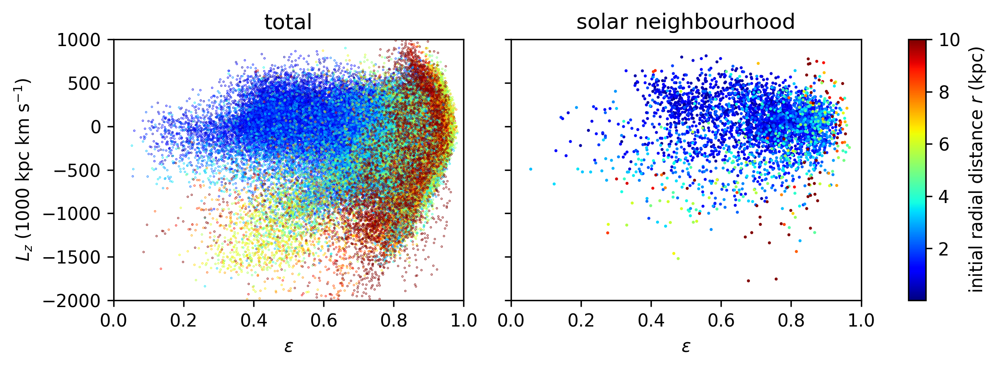

In [6]:
r0 = [-0.5, 0.9, 0.35]

loadsnap(0, pid=True)
align(sat=True)
pid_sort()
r_init = r(pos_star, r0=r0)

loadsnap(2004, pid=True)
align()
pid_sort(v=True)
L_star = angm(pos_star, v_star, 1)
sphloc([1,0])

fig = plt.figure(figsize=(8,3), dpi=300)
gs = gridspec.GridSpec(1, 3, width_ratios=[10, 10, 2])

ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1], sharey=ax0)
plt.setp(ax1.get_yticklabels(), visible=False)

s_pos_star = r(pos_star - 0 * Rs_list) < 200
cm = ax0.scatter(e_star[s_pos_star], L_star[2][s_pos_star], c=r_init[s_pos_star], cmap='jet', vmax=10, s=.05, alpha=1)
ax0.set_title('total')

s_pos_star = r(pos_star - 1 * Rs_list) < 3
ax1.scatter(e_star[s_pos_star], L_star[2][s_pos_star], c=r_init[s_pos_star], cmap='jet', vmax=10, s=.5, alpha=1)
ax1.set_title('solar neighbourhood')


for i in [ax0, ax1]:
    i.set_xlim(0, 1)
    i.set_ylim(-2000, 1000)
    i.set_xlabel('$\epsilon$')
ax0.set_ylabel(r'$L_z$ (1000 kpc km s$^{-1}$)')    
cbar_gs = gridspec.GridSpecFromSubplotSpec(1,2, subplot_spec=gs[2], wspace=2)
cax = fig.add_subplot(cbar_gs[0,0])
cb = Colorbar(ax=cax, mappable=cm)
cb.set_label('initial radial distance $r$ (kpc)')

fig.tight_layout()
plt.show()

### within solar neighbourhood for all simulations

/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':
/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


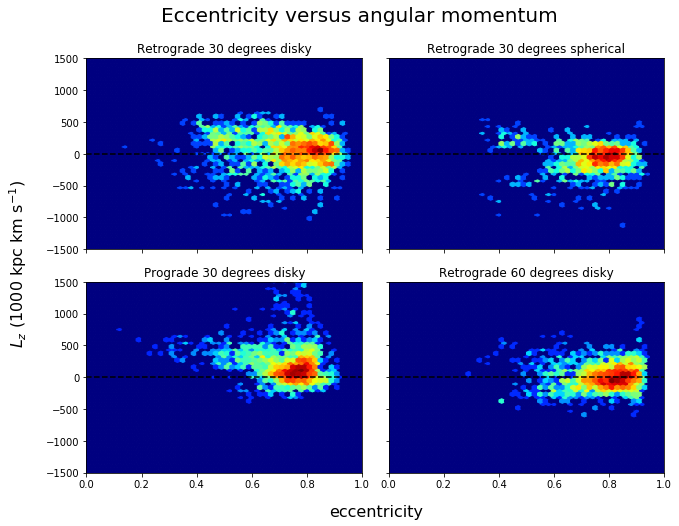

In [67]:
fig, ax = plt.subplots(2, 2, figsize=(9, 7), sharex=True, sharey=True)      # initiate figure
ax = ax.ravel()

# list data
ecc_list = ['/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr30.npy',
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_sr30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dp30.npy', 
            '/Users/users/roybos/Documents/Bachelor_Project/data/ecc_star_dr60.npy']
snaps_list = [snaps_dr30, snaps_sr30, snaps_dp30, snaps_dr60]
title_list = ['Retrograde 30 degrees disky', 'Retrograde 30 degrees spherical', \
              'Prograde 30 degrees disky', 'Retrograde 60 degrees disky'] 

for i in range(4):
    # load data of simulation i
    snaps = snaps_list[i]
    loadsnap(2004, pid=True, snaps=snaps)
    align()
    pid_sort(v=True)
    
    L_star = angm(pos_star, v_star, 1)
    e_star_i = np.load(ecc_list[i]) 
    
    # set limits
    s_x = e_star_i > 0
    s_y = (L_star[2] > -1550) & (L_star[2] < 1550)
    
    sphloc([1,0])
    s_v1_star = r(pos_star - 1 * Rs_list) < 3
    
    # plotting
    limits = [0, 1, -1500, 1500]
    ax[i].hexbin(e_star_i[s_x*s_y*s_v1_star], L_star[2][s_x*s_y*s_v1_star], bins=np.logspace(0, 3, 100), gridsize=50, cmap='jet', extent=limits)
    ax[i].axhline(0, c='k', linestyle='--')
    ax[i].set_title(title_list[i])
    ax[i].set_xlim(limits[0], limits[1])
    ax[i].set_ylim(limits[2], limits[3])

plt.tight_layout(rect=[0, 0, 1, 0.93])
fig.suptitle('Eccentricity versus angular momentum', fontsize=20)

# axis labels
ax[2].annotate('eccentricity', (1.05, -0.4), xytext=(0, 30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='center', va='bottom', size=16)
ax[2].annotate(r'$L_z$ (1000 kpc km s$^{-1}$)', (-0.1, 1.1), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=16, rotation=90)

fig.show()

## positions of particle selections

### first snapshot

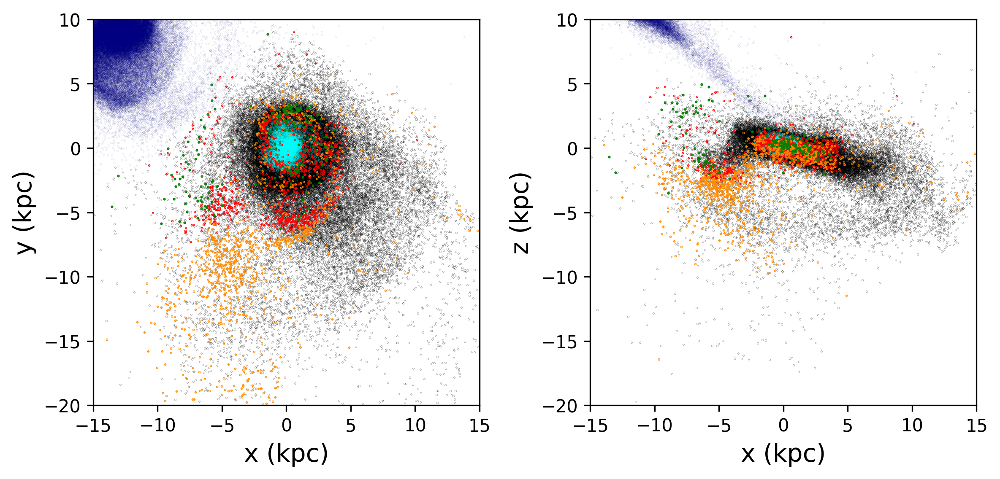

In [62]:
r0 = [-0.5, 0.9, 0.35]

loadsnap(0, pid=True)
align(sat=True, r0=r0)
pid_sort()
fig, ax = plt.subplots(1, 2, figsize=(8,4), dpi=300)

ax[0].scatter(pos_disk[0], pos_disk[1], s=0.002, marker='.', c='navy', label='host')
ax[0].scatter(pos_star[0], pos_star[1], s=0.02, marker='.', c='k', label='satellite')
#ax[0].scatter(pos_star[0][s_Lz_ecc_7], pos_star[1][s_Lz_ecc_7], s=1, marker='.', c='magenta', label='satellite')
#ax[0].scatter(pos_star[0][s_Lz_ecc_8], pos_star[1][s_Lz_ecc_8], s=1, marker='.', c='orange', label='satellite')
#ax[0].scatter(pos_star[0, s_Lz_ecc_3], pos_star[1, s_Lz_ecc_3], s=0.05, marker='.', c='green', label='right blob')
ax[0].scatter(pos_star[0, s_Lz_ecc_1], pos_star[1, s_Lz_ecc_1], s=0.01, marker='.', c='cyan', label='left blob')
ax[0].scatter(pos_star[0, s_Lz_ecc_2], pos_star[1, s_Lz_ecc_2], s=.4, marker='.', c='r', label='left arm')
ax[0].scatter(pos_star[0, s_Lz_ecc_4], pos_star[1, s_Lz_ecc_4], s=.4, marker='.', c='darkorange', label='right arm')
#ax[0].scatter(pos_star[0, s_Lz_ecc_5], pos_star[1, s_Lz_ecc_5], s=1, marker='.', c='pink', label='leftest arm')
#ax[0].scatter(pos_star[0][s_Lz_ecc_9], pos_star[1][s_Lz_ecc_9], s=.03, marker='.', c='cyan', label='high eccentricity')
#ax[0].scatter(pos_disk[0], pos_disk[1], s=1, marker='.', alpha=0.05, label='host')
ax[0].set_ylabel('y (kpc)', fontsize=14)

ax[1].scatter(pos_disk[0], pos_disk[2], s=0.002, marker='.', c='navy', label='host')
ax[1].scatter(pos_star[0], pos_star[2], s=0.02, marker='.', c='k', label='satellite')
#ax[1].scatter(pos_star[0][s_Lz_ecc_7], pos_star[2][s_Lz_ecc_7], s=1, marker='.', c='magenta', label='satellite')
#ax[1].scatter(pos_star[0][s_Lz_ecc_8], pos_star[2][s_Lz_ecc_8], s=1, marker='.', c='orange', label='satellite')
#ax[1].scatter(pos_star[0, s_Lz_ecc_3], pos_star[2, s_Lz_ecc_3], s=0.05, marker='.', c='green', label='right blob')
ax[1].scatter(pos_star[0, s_Lz_ecc_1], pos_star[2, s_Lz_ecc_1], s=0.01, marker='.', c='cyan', label='left blob')
ax[1].scatter(pos_star[0, s_Lz_ecc_2], pos_star[2, s_Lz_ecc_2], s=.4, marker='.', c='r', label='left arm')
ax[1].scatter(pos_star[0, s_Lz_ecc_4], pos_star[2, s_Lz_ecc_4], s=.4, marker='.', c='darkorange', label='right arm')
#ax[1].scatter(pos_star[0, s_Lz_ecc_5], pos_star[2, s_Lz_ecc_5], s=1, marker='.', c='pink', label='leftest arm')
#ax[1].scatter(pos_star[0][s_Lz_ecc_9], pos_star[2][s_Lz_ecc_9], s=.03, marker='.', c='cyan', label='high eccentricity')

ax[1].set_ylabel('z (kpc)', fontsize=14)

for j in [0,1]:
    ax[j].set_xlim(-15, 15)
    ax[j].set_ylim(-20, 10)
    ax[j].set_xlabel('x (kpc)', fontsize=14)
    ax[j].set_aspect('equal')

    '''# to show actually visible dots in the legend
    lgnd = ax[j].legend(loc=1)
    for k in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[k]._sizes = [30]    
        lgnd.legendHandles[k].set_alpha(1)'''

#fig.suptitle('Positions of particle selections at ${:.2f} \ Gyr$'.format(time(snap_n)))
fig.tight_layout(rect=[0, 0, 1, 0.95])
#ax[0].scatter(r0[0], r0[1])
#ax[1].scatter(r0[0], r0[2])
plt.show()

### over time

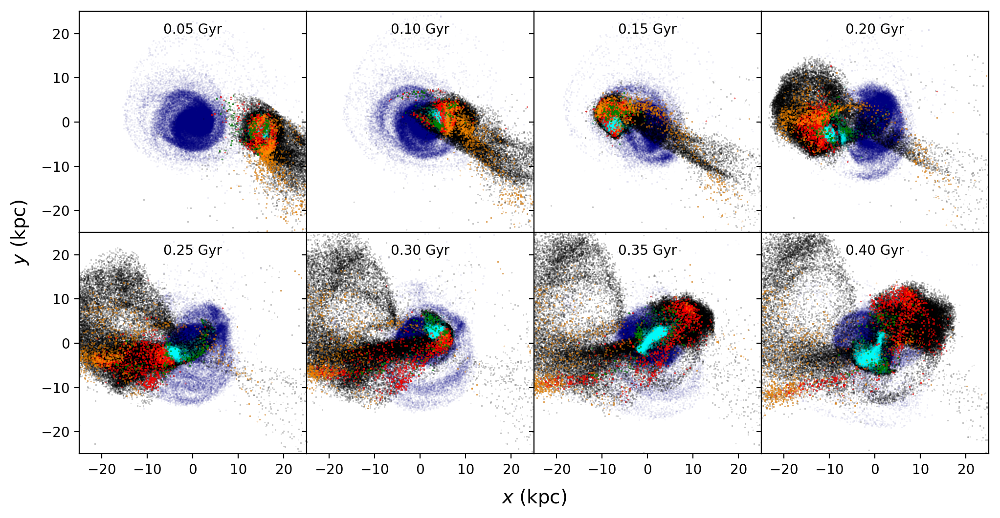

In [63]:
fig, ax = plt.subplots(2, 4, figsize=(12, 6), sharey=True, sharex=True, dpi=200)
ax = ax.ravel()
plt.subplots_adjust(hspace=0, wspace=0)
for a, t in zip(ax, [10, 20, 30, 40, 50, 60, 70, 80]):
    a.set_xlim(-25, 25)
    a.set_ylim(-25, 25)
    #a.set_xticks([-10, -5, 0, 5, 10])
    #a.set_yticks([-10, -5, 0, 5, 10])
    a.annotate('{:.2f} Gyr'.format(time(t)), xy=(0, 20), ha='center')
                
    loadsnap(t, pid=True)
    align(sat=False)
    pid_sort()
    
    a.scatter(pos_disk[0], pos_disk[1], s=0.002, marker='.', c='navy')
    a.scatter(pos_star[0], pos_star[1], s=0.02, marker='.', c='k', label='satellite')
    a.scatter(pos_star[0, s_Lz_ecc_1], pos_star[1, s_Lz_ecc_1], s=0.01, marker='.', c='cyan', label='left blob')
    a.scatter(pos_star[0, s_Lz_ecc_2], pos_star[1, s_Lz_ecc_2], s=.2, marker='.', c='r', label='left arm')
    a.scatter(pos_star[0, s_Lz_ecc_4], pos_star[1, s_Lz_ecc_4], s=.1, marker='.', c='darkorange', label='right arm')
    a.scatter(pos_star[0, s_Lz_ecc_5], pos_star[1, s_Lz_ecc_5], s=.3, marker='.', c='green', label='leftest arm')

ax[0].annotate('$y$ (kpc)', (0, 0), xytext=(-38, -25), rotation=90, ha='center', va='center', fontsize=14)
ax[5].annotate('$x$ (kpc)', (0, 0), xytext=(25, -35), ha='center', va='center', fontsize=14)
plt.show()

# other

/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


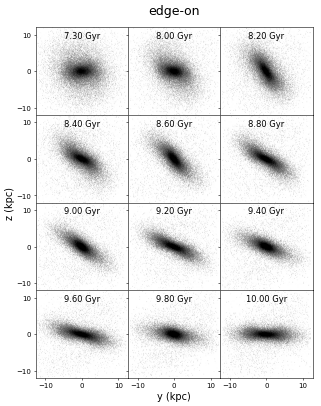

In [197]:
# find rotation matrix of last snapshot
loadsnap(2004)
R_0 = align(rotmat=True)

# initialize figure
fig, ax = plt.subplots(4, 3, figsize=(6,8), dpi=50, sharex=True, sharey=True)
ax = ax.ravel()

k = 2

snaplist = [1464, 1604, 1644, 1684, 1724, 1764, 1804, 1844, 1884, 1924, 1964, 2004]
for i, j in enumerate(snaplist):
    # load data
    loadsnap(j)
    align(R_0)
    
    limits = [-12, 12, -12, 12]
    ax[i].set_xlim(limits[0], limits[1])
    ax[i].set_ylim(limits[2], limits[3])
    ax[i].set_aspect('equal')
    
    # plot subplots
    ax[i].hexbin(pos_disk[1], pos_disk[k], bins=np.logspace(-0.7, 1.7, 100), gridsize=250, \
                 cmap='Greys', extent=limits)
    ax[i].text(0, 9, '{:.2f} Gyr'.format(time(j)), fontsize=12, ha='center')
    

ax[10].annotate('y (kpc)', (0.5, -0.5), xytext=(0, 30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='center', va='bottom', size=14)
if k == 1:
    ax[3].annotate('y (kpc)', (0, 0), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
    plt.suptitle('face-on', fontsize=18)
if k == 2:
    ax[3].annotate('z (kpc)', (0, 0), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
    plt.suptitle('edge-on', fontsize=18)
    
fig.tight_layout(rect=[-0.05, 0, 1, 0.95])
plt.subplots_adjust(wspace=0, hspace=0)
plt.xticks(np.arange(-10, 11, step=10))
plt.yticks(np.arange(-10, 11, step=10))
plt.show()

In [ ]:
fig, ax = plt.subplots(3, 4, figsize=(11.4286,8.57), dpi=200, sharey=True, sharex=True)
ax = ax.ravel()
for i, t in enumerate([201, 401, 601, 802, 1002, 1203, 1403, 1503, 1603, 1704, 1804, 1904]):
    
    loadsnap(t, pid=True, scale=1)
    align()
    pid_sort(v=True)
    v_cyl()

    # location of sphere of selection
    Rs = 2.4 * Rd
    R_disk = 2.5
    R_disk *= 1

    v_star *= 1.5
    v_disk *= 1.5

    # boolean to select paticles within a sphere of radius 2.5 kpc at x = Rs
    s_v1_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
    s_v1_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)

    # boolean to select paticles within a sphere of radius 2 kpc at x = Rs
    s_v2_disk = (np.sqrt((pos_disk[0] - Rs)**2 + pos_disk[1]**2 + pos_disk[2]**2) < R_disk)
    s_v2_star = (np.sqrt((pos_star[0] - Rs)**2 + pos_star[1]**2 + pos_star[2]**2) < R_disk)
    
    
    ax[i].scatter(-v_disk[1][s_v1_disk], np.sqrt(v_disk[0]**2 + v_disk[2]**2)[s_v1_disk], s=1,  label='host')
    ax[i].scatter(-v_star[1][s_v1_star], np.sqrt(v_star[0]**2 + v_star[2]**2)[s_v1_star], s=1,  label='satellite')
    ax[i].set_xlim(-480, 300)
    ax[i].set_ylim(0, 500)
    ax[i].annotate('{:.2f} Gyr'.format(time(t)), xy=(-400, 450))
    if i >= 8:
        ax[i].set_xlabel(r'Scaled $v_R$ (km/s)')
    if i % 4 == 0:
        ax[i].set_ylabel(r'Scaled $\sqrt{v_R^2 + v_z^2}$ (km/s)')

        


'''    ax[1, i].scatter(v_disk[0][s_v2_disk], -v_disk[1][s_v2_disk], s=1, label='host')
    ax[1, i].scatter(v_star[0][s_v2_star], -v_star[1][s_v2_star], s=1, label='satellite')
    ax[1, i].set_xlim(-450, 450)
    ax[1, i].set_ylim(-400, 400)'''


#ax[0].set_xlabel(r'Scaled $v_\phi$ (km/s)')
#ax[1, 0].set_ylabel(r'Scaled $v_\phi$ (km/s)')
    
'''for i in [0,1]:
    lgnd = ax[i].legend(loc=1)
    for component in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[component]._sizes = [30]'''
#fig.suptitle('Velocity distributions at ${:.2f} \ Gyr$'.format(time(snap_n)), fontsize=20)
#plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

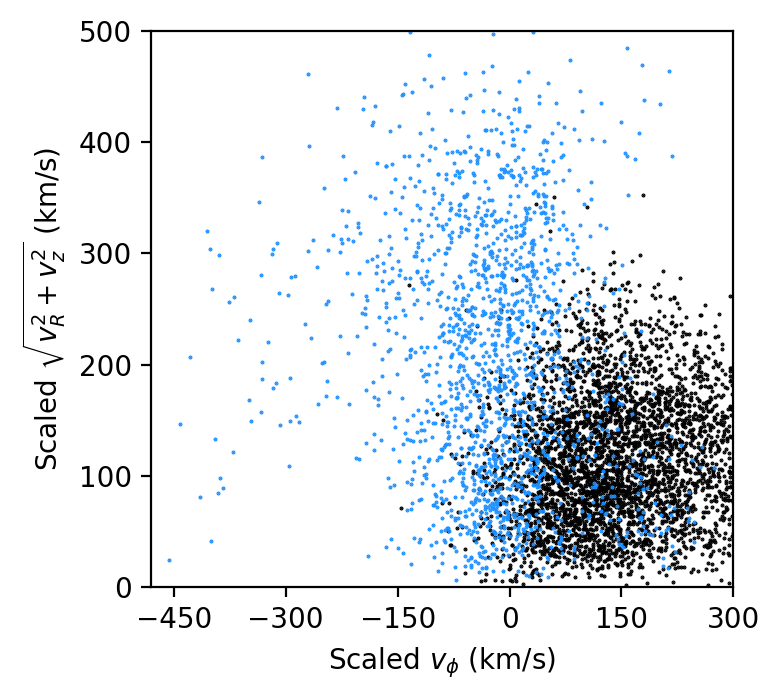

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(4,4), dpi=200)
ax.scatter(-v_disk[1][s_v1_disk], np.sqrt(v_disk[0]**2 + v_disk[2]**2)[s_v1_disk], s=.2,  label='host', c='k')
ax.scatter(-v_star[1][s_v1_star], np.sqrt(v_star[0]**2 + v_star[2]**2)[s_v1_star], s=.2,  label='satellite', c='dodgerblue')
ax.set_xlabel(r'Scaled $v_\phi$ (km/s)')
ax.set_ylabel(r'Scaled $\sqrt{v_R^2 + v_z^2}$ (km/s)')
ax.set_xlim(-480, 300)
ax.set_ylim(0, 500)
ax.set_xticks(np.linspace(-450, 300, 6))

#fig.suptitle('Velocity distributions at ${:.2f} \ Gyr$'.format(time(snap_n)), fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()

In [7]:
loadsnap(0)
R_0 = align(rotmat=True)

for i in range(1002, 1003, 1):
    loadsnap(i, pid=True)
    align()
    pid_sort()
    fig, ax = plt.subplots(1, 2, figsize=(10,5), dpi=200)
    
    ax[0].hexbin(pos_star[0], pos_star[1], label='satellite', cmap=cma(b=1), gridsize=300, bins=np.logspace(-1,5,100))
    #ax[0].scatter(pos_star[0, s_Lz_ecc_1], pos_star[1, s_Lz_ecc_1], s=0.01, marker='.', label='left blob')
    #ax[0].scatter(pos_star[0, s_Lz_ecc_2], pos_star[1, s_Lz_ecc_2], s=0.01, marker='.', label='arm')
    ax[0].hexbin(pos_disk[0], pos_disk[1], label='host', cmap=cma(), gridsize=300, bins=np.logspace(-1,5,100))
    ax[0].set_ylabel('$y$ (kpc)')
    
    ax[1].hexbin(pos_star[0], pos_star[2], label='satellite', cmap=cma(b=1), gridsize=300, bins=np.logspace(-1,5,100))
    #ax[1].scatter(pos_star[0, s_Lz_ecc_1], pos_star[2, s_Lz_ecc_1], s=0.01, marker='.', label='left blob')
    #ax[1].scatter(pos_star[0, s_Lz_ecc_2], pos_star[2, s_Lz_ecc_2], s=0.01, marker='.', label='arm')
    ax[1].hexbin(pos_disk[0], pos_disk[2], label='host', cmap=cma(), gridsize=300, bins=np.logspace(-1,5,100))
    ax[1].set_ylabel('$z$ (kpc)')
    
    for j in [0,1]:
        ax[j].set_xlim(-40, 40)
        ax[j].set_ylim(-40, 40)
        ax[j].set_xlabel('$x$ (kpc)')
    
    fig.suptitle('Positions of particles at ${:.2f} \ Gyr$'.format(time(snap_n)))
    plt.savefig('./snaps/tmp7/fig_{:04d}.jpg'.format(i))
    plt.close()

/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


/Software/users/modules/7/software/anaconda3/4.2.0/lib/python3.5/site-packages/matplotlib/axes/_axes.py:4395: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bins == 'log':


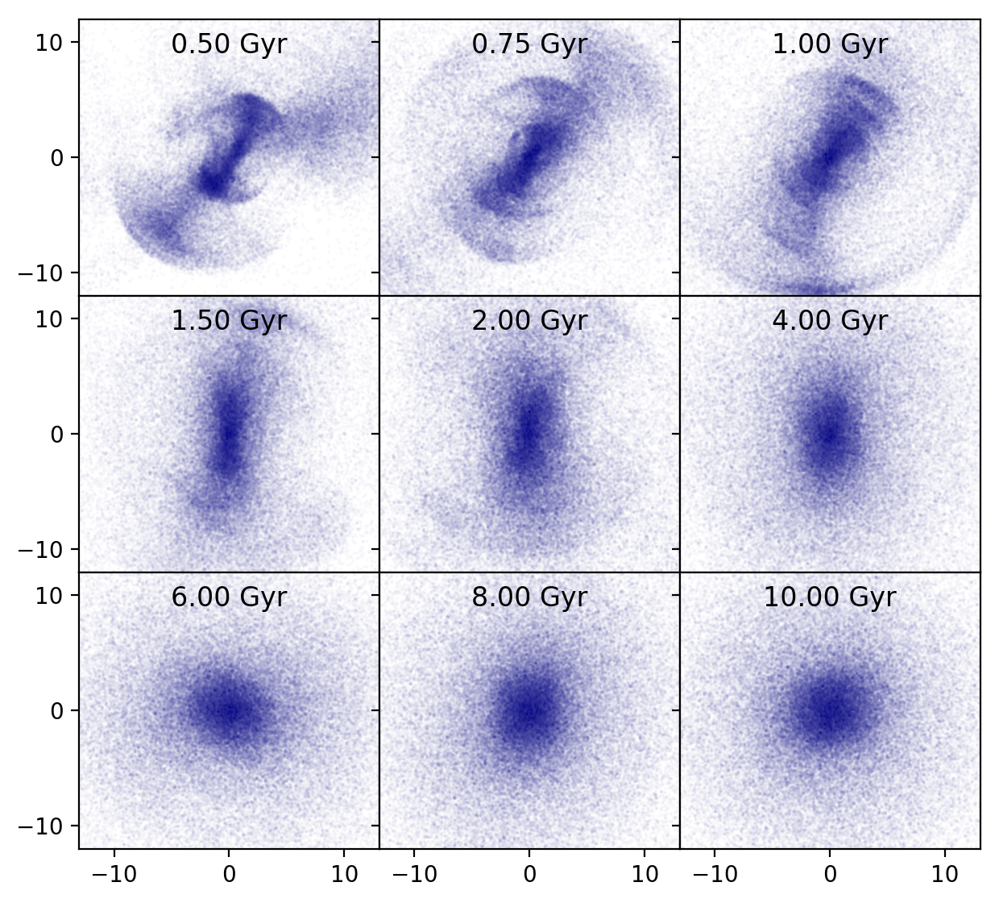

In [19]:
# find rotation matrix of last snapshot
loadsnap(2004)
R_0 = align(rotmat=True)

# initialize figure
fig, ax = plt.subplots(3, 3, figsize=(6,6), dpi=200, sharex=True, sharey=True)
ax = ax.ravel()

k = 1

snaplist = [100, 150, 200, 300, 401, 801, 1202, 1603, 2004]
for i, j in enumerate(snaplist):
    # load data
    loadsnap(j)
    align()
    
    limits = [-12, 12, -12, 12]
    ax[i].set_xlim(limits[0], limits[1])
    ax[i].set_ylim(limits[2], limits[3])
    ax[i].set_aspect('equal')
    
    # plot subplots
    ax[i].hexbin(pos_star[0], pos_star[k], bins=np.logspace(-0.7, 1.7, 100), gridsize=250, \
                 cmap=cma(b=.5), extent=1.1*np.array(limits))
    ax[i].text(0, 9, '{:.2f} Gyr'.format(time(j)), fontsize=12, ha='center')
    

'''ax[-1].annotate('x (kpc)', (0, 0), xytext=(0, -30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='center', va='bottom', size=14)
if k == 1:
    ax[3].annotate('y (kpc)', (0, 0), xytext=(-30, 0),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
    plt.suptitle('face-on', fontsize=18)
if k == 2:
    ax[3].annotate('z (kpc)', (0, 0), xytext=(-30, 30),
                    textcoords='offset points', xycoords='axes fraction',
                    ha='right', va='center', size=14, rotation=90)
    plt.suptitle('edge-on', fontsize=18)'''
    
fig.tight_layout(rect=[-0.05, 0, 1, 0.95])
plt.subplots_adjust(wspace=0, hspace=0)
plt.xticks(np.arange(-10, 11, step=10))
plt.yticks(np.arange(-10, 11, step=10))
plt.show()